### Temperature Forecast Project 

**Project Description**

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

**Attribute Information:**
For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

You have to build separate models that can predict:
- **minimum temperature for the next day and**
- **maximum temperature for the next day based on the details provided in the dataset**



In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('temperature.csv')
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


- The dataset has numbers

In [3]:
df.shape

(7752, 25)

- The dataset has 7752 rows and 25 columns

### Exploratory Data Analysis

In [4]:
df.columns.to_list()

['station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

- We notice the different variables present in dataset in the list form

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


- The dataset has dtypes: float64(24), object(1) and memory usage: 1.5+ MB

In [6]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

- The dataset has dtypes: float64(24), object(1)

In [7]:
df.duplicated().sum()

0

- The data has no duplicates

In [8]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

- We have null values in the dataset that need to be adjusted or dropped

In [9]:
df.isnull().sum().sum()

1248

- The total null values are 1248

<Axes: >

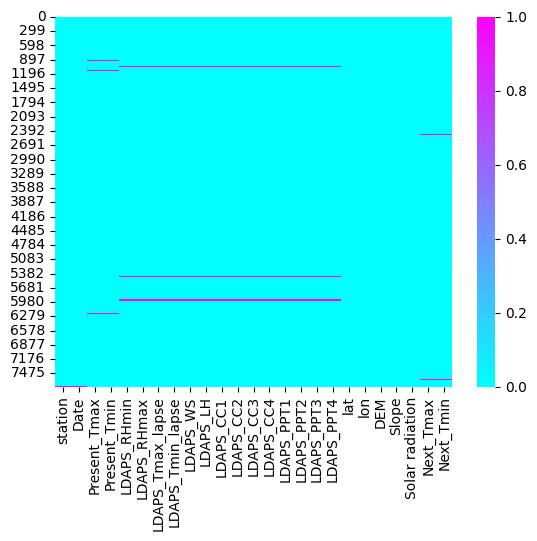

In [10]:
# Lets check for null values again
sns.heatmap(df.isnull(),cmap='cool')

- The presence of 1248 null values is clearly visible through the visualization provided by the heatmap 

In [11]:
df.dropna(axis=0,inplace=True)

- Remove any rows that have null values

In [12]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

- Dataset has no more null values

In [13]:
df.shape

(7588, 25)

- The new shape has 7588 rows and 25 columns

In [14]:
df['Date'] = pd.to_datetime(df['Date'])

- converting Date variable from object dtype to datetime dtype

In [15]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

In [16]:
print('Min. Date: ',df['Date'].min())
print('Max. Date: ',df['Date'].max())

Min. Date:  2013-06-30 00:00:00
Max. Date:  2017-08-30 00:00:00


- The analysis is carried from 30'june 2013 to 30'July 2017

In [17]:
df1 = df.copy()

- We made a new daframe df1

In [18]:
df1.drop(columns=['Date'],axis=0,inplace=True)

- From df1 we dropped date column to understand statistics of numerical columns

In [19]:
df1.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.000000,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,...,0.480738,0.275007,0.265373,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,...,1.743327,1.146087,1.179661,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,...,0.000000,0.000000,0.000000,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,...,0.000000,0.000000,0.000000,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,...,0.017735,0.007855,0.000017,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000


- The dataset has 7588 entries, of meteorological parameters like temperature, humidity, and wind speed.
- The summary provides metrics such as mean, standard deviation, and range for each specific variable.
- The dataset includes station particulars, a diverse temperature range like Next_Tmax: 38.9°C to Present_Tmin: 11.3°C, and geographical coordinates like lat: 37.5507, lon: 126.995 contribute to the dataset's complexity.
- Solar radiation, a key factor, exhibits a mean of 5343.72, environmental dynamics.
- It emphasizes Next_Tmax and Next_Tmin (target values) bringing insights into climatic patterns and trends.

In [20]:
numerical_columns=[i for i in df.columns if df[i].nunique()>30 and i!='Date']
categorical_columns=[i for i in df.columns if df[i].nunique()<30]

- Identified numerical columns with more than 30 unique values, excluding 'Date'.
- Categorized columns with fewer than 30 unique values as categorical.
- This classification aids in distinguishing variable types for effective data analysis.

In [21]:
numerical_columns

['Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

- A list of numerical columns in the dataset

In [22]:
categorical_columns

['station', 'lat', 'lon', 'DEM', 'Slope']

-  A list of categorical columns in the dataset

In [23]:
df.duplicated().sum()

0

- The dataset has no duplicates

In [24]:
for i in df:
    print(df[i].value_counts())
    print('\n')

station
25.0    307
10.0    307
23.0    307
18.0    307
17.0    307
2.0     307
3.0     306
4.0     306
13.0    305
16.0    304
20.0    304
21.0    304
14.0    303
1.0     303
9.0     302
12.0    302
15.0    302
19.0    302
22.0    302
24.0    302
11.0    301
7.0     301
6.0     301
8.0     300
5.0     296
Name: count, dtype: int64


Date
2013-06-30    25
2016-07-23    25
2015-08-22    25
2015-08-23    25
2015-08-24    25
              ..
2015-08-13    22
2015-07-24    22
2017-07-06    22
2017-08-23    22
2017-06-30    16
Name: count, Length: 307, dtype: int64


Present_Tmax
31.4    112
29.4    108
29.1    106
29.2    105
30.6    105
       ... 
21.2      1
20.1      1
36.4      1
20.3      1
20.0      1
Name: count, Length: 167, dtype: int64


Present_Tmin
24.0    160
23.8    153
23.5    143
23.1    143
23.3    140
       ... 
14.3      1
29.9      1
29.7      1
29.1      1
15.0      1
Name: count, Length: 155, dtype: int64


LDAPS_RHmin
77.030350    2
51.810596    2
71.658089    2
58

- The value_counts function provides an insightful summary of unique occurrences within a dataset.
- It enumerates the frequency of each unique value, aiding in the identification of predominant categories and highlighting the distribution of data

In [25]:
df.nunique().to_frame('No: of unique values')

,No: of unique values
station,25
Date,307
Present_Tmax,167
Present_Tmin,155
LDAPS_RHmin,7585
LDAPS_RHmax,7577
LDAPS_Tmax_lapse,7588
LDAPS_Tmin_lapse,7588
LDAPS_WS,7588
LDAPS_LH,7588


- The number of unique values for each column in the DataFrame has been summarized which provides a quick overview of the distinct elements within each column, aiding in the understanding of data variability and uniqueness.

### Data Visualization

### Univariate Analysis

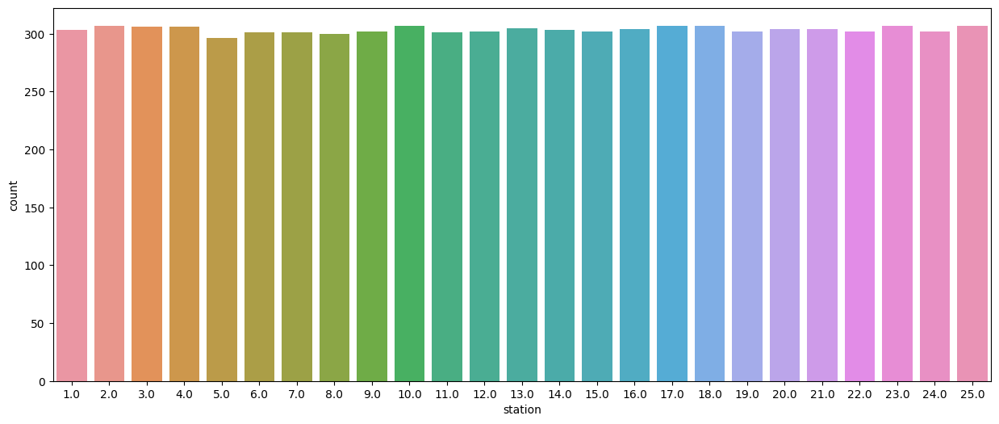

station
25.0    307
10.0    307
23.0    307
18.0    307
17.0    307
2.0     307
3.0     306
4.0     306
13.0    305
16.0    304
20.0    304
21.0    304
14.0    303
1.0     303
9.0     302
12.0    302
15.0    302
19.0    302
22.0    302
24.0    302
11.0    301
7.0     301
6.0     301
8.0     300
5.0     296
Name: count, dtype: int64

In [26]:
plt.figure(figsize=(15,6))
sns.countplot(x='station', data=df)
plt.show()

df['station'].value_counts()

- The 'station' column displays varying counts for different station numbers, ranging from 296 to 307.
- This distribution indicates potential patterns in data collection across the 25 unique stations.

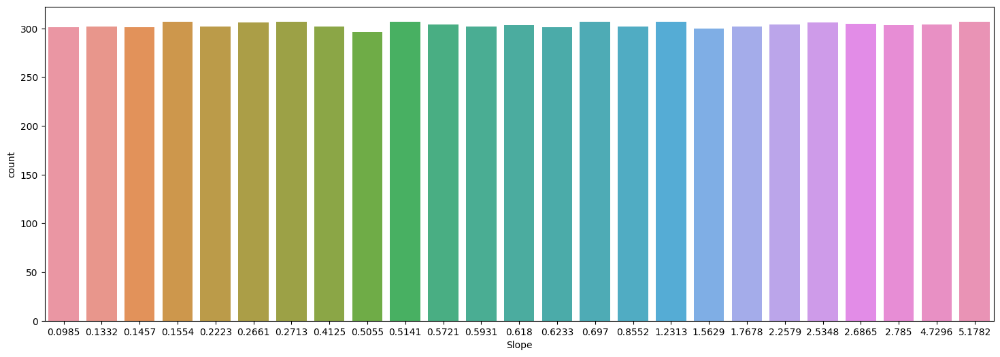

Slope
0.2713    307
5.1782    307
0.1554    307
1.2313    307
0.6970    307
0.5141    307
0.2661    306
2.5348    306
2.6865    305
2.2579    304
4.7296    304
0.5721    304
0.6180    303
2.7850    303
0.4125    302
0.5931    302
0.8552    302
1.7678    302
0.1332    302
0.2223    302
0.6233    301
0.0985    301
0.1457    301
1.5629    300
0.5055    296
Name: count, dtype: int64

In [27]:
plt.figure(figsize=(18,6))
sns.countplot(x='Slope', data=df)
plt.xticks(fontsize=10)
plt.show()
df['Slope'].value_counts()

- The 'Slope' column exhibits a uniform count of 296 to 307 for various slope values.
- This consistency across different slope measurements suggests a balanced distribution in the dataset.

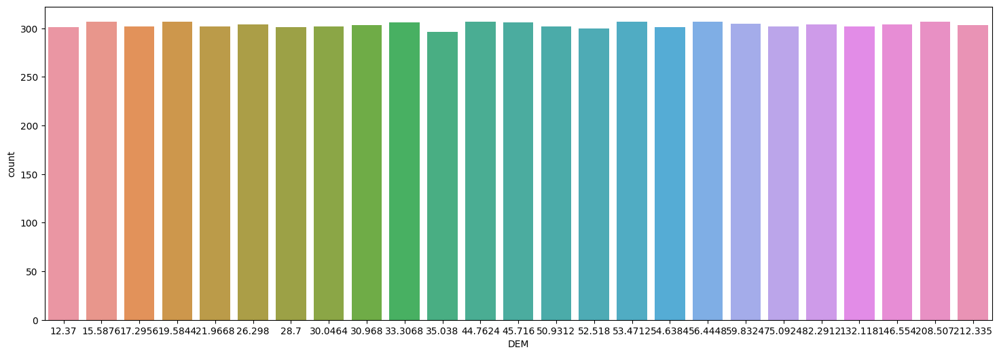

DEM
19.5844     307
208.5070    307
15.5876     307
56.4448     307
53.4712     307
44.7624     307
33.3068     306
45.7160     306
59.8324     305
82.2912     304
146.5540    304
26.2980     304
30.9680     303
212.3350    303
50.9312     302
132.1180    302
30.0464     302
75.0924     302
21.9668     302
17.2956     302
28.7000     301
12.3700     301
54.6384     301
52.5180     300
35.0380     296
Name: count, dtype: int64

In [28]:
plt.figure(figsize=(18,6))
sns.countplot(x='DEM', data=df)
plt.xticks(fontsize=10)
plt.show()
df['DEM'].value_counts()

- 'DEM' values range from 19.5844 to 208.5070, each with a consistent count of 296 to 307.
- This distribution across diverse elevations implies a varied topographical dataset.

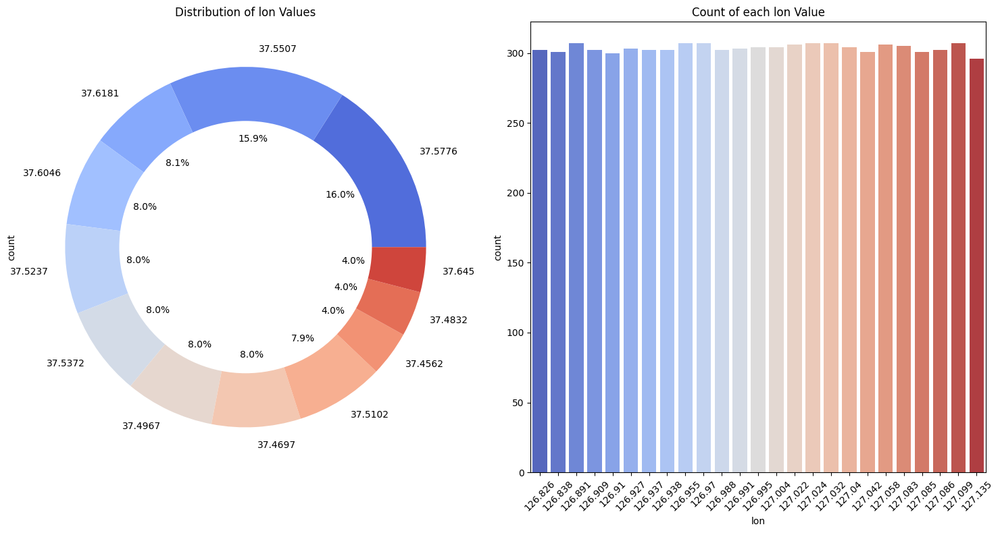

lon
126.970    307
126.955    307
126.891    307
127.024    307
127.099    307
127.032    307
127.058    306
127.022    306
127.083    305
126.995    304
127.004    304
127.040    304
126.927    303
126.991    303
126.826    302
126.988    302
126.937    302
126.938    302
127.086    302
126.909    302
127.085    301
126.838    301
127.042    301
126.910    300
127.135    296
Name: count, dtype: int64

In [29]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
df['lat'].value_counts().plot.pie(autopct='%1.1f%%', colors=sns.color_palette('coolwarm', len(df['lat'].unique())))
centre = plt.Circle((0, 0), 0.7, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre)
plt.title('Distribution of lon Values')

plt.subplot(1, 2, 2)
sns.countplot(x='lon', data=df, palette='coolwarm')  
plt.title('Count of each lon Value')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

df['lon'].value_counts()

- The 'lon' column reveals consistent counts ranging from 296 to 307 for various longitudinal values.
- This uniform distribution suggests well-represented geographical coverage in the dataset across different longitudes.

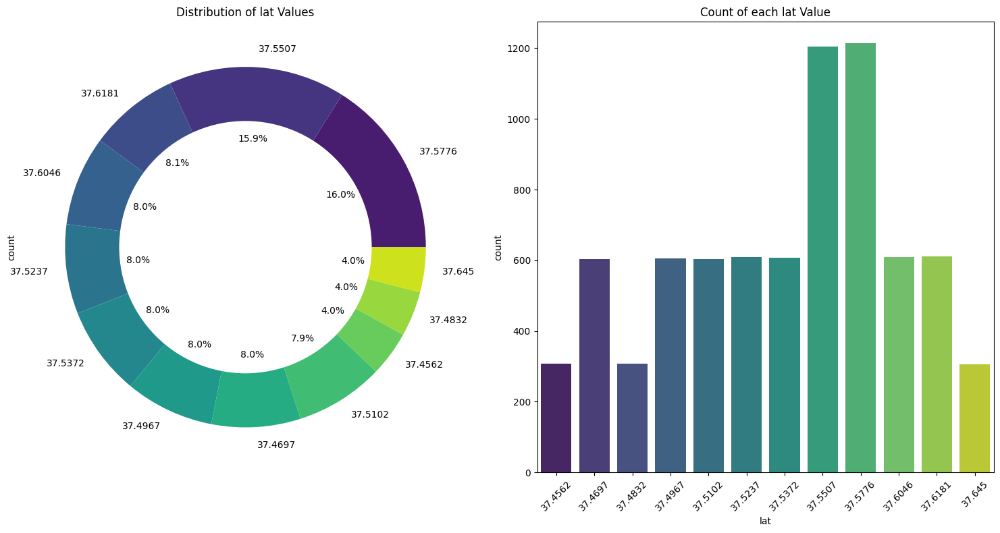

lat
37.5776    1214
37.5507    1204
37.6181     611
37.6046     610
37.5237     609
37.5372     608
37.4967     605
37.4697     604
37.5102     603
37.4562     307
37.4832     307
37.6450     306
Name: count, dtype: int64

In [30]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
df['lat'].value_counts().plot.pie(autopct='%1.1f%%', colors=sns.color_palette('viridis', len(df['lat'].unique())))
centre = plt.Circle((0, 0), 0.7, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre)
plt.title('Distribution of lat Values')


plt.subplot(1, 2, 2)
sns.countplot(x='lat', data=df, palette='viridis')
plt.title('Count of each lat Value')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

df['lat'].value_counts()

- The 'lat' column exhibits varying counts, with values like 37.5776 and 37.5507 occurring 1214 and 1204 times, respectively.
- This distribution highlights diversity in latitude measurements, with some values appearing more frequently in the dataset.

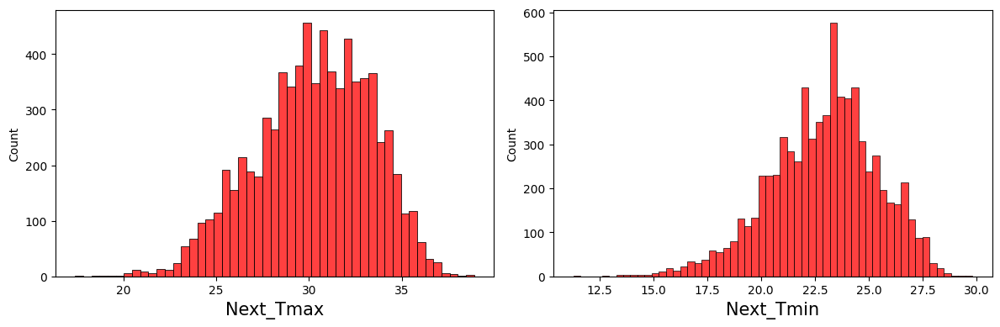

Target_variable Minimum Next_Tmax is 17.4 and Maximum Next_Tmax is 38.9
Target_variable Minimum Next_Tmin is 11.3 and Maximum Next_Tmin is 29.8


In [31]:
target_variables = ['Next_Tmax', 'Next_Tmin'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in target_variables:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'r')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Target_variable Minimum Next_Tmax is {} and Maximum Next_Tmax is {}'.format(df['Next_Tmax'].min(), df['Next_Tmax'].max()))
print('Target_variable Minimum Next_Tmin is {} and Maximum Next_Tmin is {}'.format(df['Next_Tmin'].min(), df['Next_Tmin'].max()))

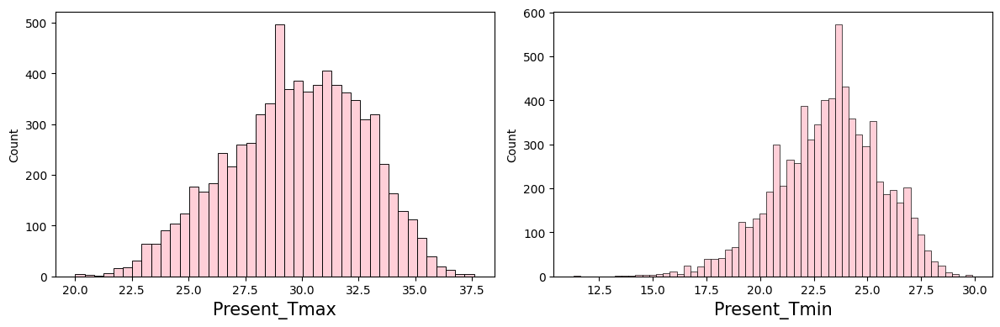

Present Minimum Tmax: 20.0 and Maximum Tmax: 37.6
Present Minimum Tmin: 11.3 and Maximum Tmin: 29.9


In [32]:
air_temperature = ['Present_Tmax', 'Present_Tmin'] 
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in air_temperature:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'pink')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Present Minimum Tmax: {} and Maximum Tmax: {}'.format(df['Present_Tmax'].min(),df['Present_Tmax'].max()))
print('Present Minimum Tmin: {} and Maximum Tmin: {}'.format(df['Present_Tmin'].min(),df['Present_Tmin'].max()))

- Present Tmax and Tmin nearly has normal distributions.
- Tmax peaks ranges from 37.6 to 20, with a daily maximum of 28.5.
- Tmin ranges from 29.9 to 11.3, with a minimum of 23.

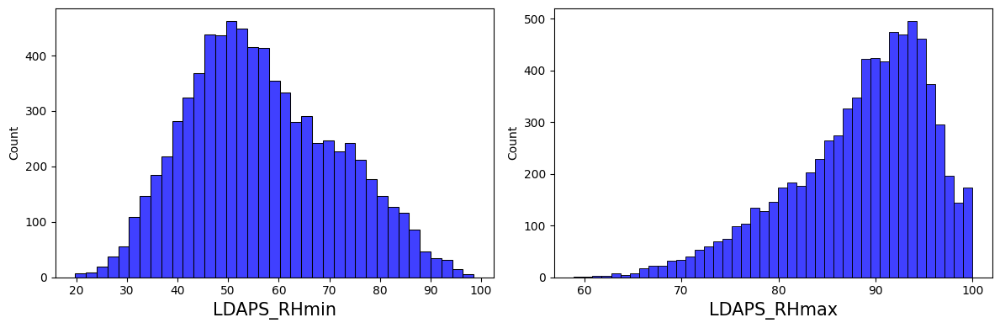

Relative Humidity of Minimum RHmax: 58.93628311 and Maximum RHmax: 100.0001526
Relative Humidity of Minimum RHmin: 19.79466629 and Maximum RHmin: 98.5247345


In [33]:
rel_humidity = ['LDAPS_RHmin', 'LDAPS_RHmax']
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in rel_humidity:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'b')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Relative Humidity of Minimum RHmax: {} and Maximum RHmax: {}'.format(df['LDAPS_RHmax'].min(),df['LDAPS_RHmax'].max()))
print('Relative Humidity of Minimum RHmin: {} and Maximum RHmin: {}'.format(df['LDAPS_RHmin'].min(),df['LDAPS_RHmin'].max()))

- The dataset indicates a left-skewed distribution for Maximum Relative Humidity (RHmax) and a slight right-skewed distribution for Minimum Relative Humidity (RHmin).
- RHmax falls within the range of 92 to 97, while RHmin is primarily distributed between 45 and 62 for the majority of days.

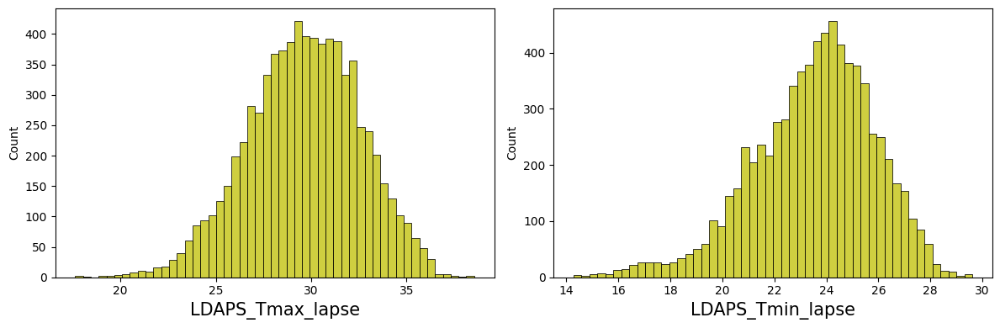

Minimum Tmax applied lapse rate: 17.62495378 and Maximum Tmax applied lapse rate: 38.54225522
Minimum Tmin is applied lapse rate:  14.27264631 and Maximum Tmin applied lapse rate: 29.61934244


In [34]:
temperature_lapse = ['LDAPS_Tmax_lapse','LDAPS_Tmin_lapse']
plt.figure(figsize=(12,4),facecolor='white')
plotnumber=1

for col in temperature_lapse:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'y')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Minimum Tmax applied lapse rate: {} and Maximum Tmax applied lapse rate: {}'.format(df['LDAPS_Tmax_lapse'].min(),df['LDAPS_Tmax_lapse'].max()))
print('Minimum Tmin is applied lapse rate:  {} and Maximum Tmin applied lapse rate: {}'.format(df['LDAPS_Tmin_lapse'].min(),df['LDAPS_Tmin_lapse'].max()))

- The Tmax and Tmin values adjusted for the applied lapse rate exhibit nearly normal distributions. Tmax_lapse peaks at 38.54, has a minimum of 17.62, and is in the range of 27 to 32 for most days.
- Tmin_lapse reaches a maximum of 29.61, a minimum of 14.27, and is concentrated in the range of 23 to 26 for the majority of days.

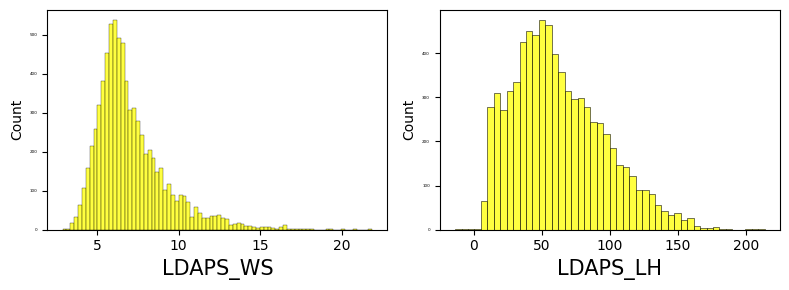

Wind_speed Minimum 2.882579625
Wind_speed Maximum 21.85762099


Latent_Heat Minimum -13.60321209
Latent_Heat Maximum 213.4140062


In [35]:
wind_speed_latent_heat = [ 'LDAPS_WS', 'LDAPS_LH']
plt.figure(figsize=(8,3),facecolor='white')
plotnumber=1

for col in wind_speed_latent_heat:
    if plotnumber <=2:
        ax=plt.subplot(1,2,plotnumber)
        sns.histplot(df[col],color = 'yellow')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 3)
    plotnumber+=1
plt.tight_layout()
plt.show()

print('Wind_speed Minimum',df['LDAPS_WS'].min())
print('Wind_speed Maximum',df['LDAPS_WS'].max())
print('\n')

print('Latent_Heat Minimum',df['LDAPS_LH'].min())
print('Latent_Heat Maximum',df['LDAPS_LH'].max())

- The dataset for average wind speed is right-skewed, ranging from a minimum of 2.88m/s to a maximum of 21.85m/s. The majority of values are concentrated in the range of 5m/s to 8m/s.

- Latent heat flux appears to follow a nearly normal distribution with a slight right skewness. Ranging from a minimum of -13.60 to a maximum of 213.41, the majority of its values are concentrated in the range of 30 to 70.

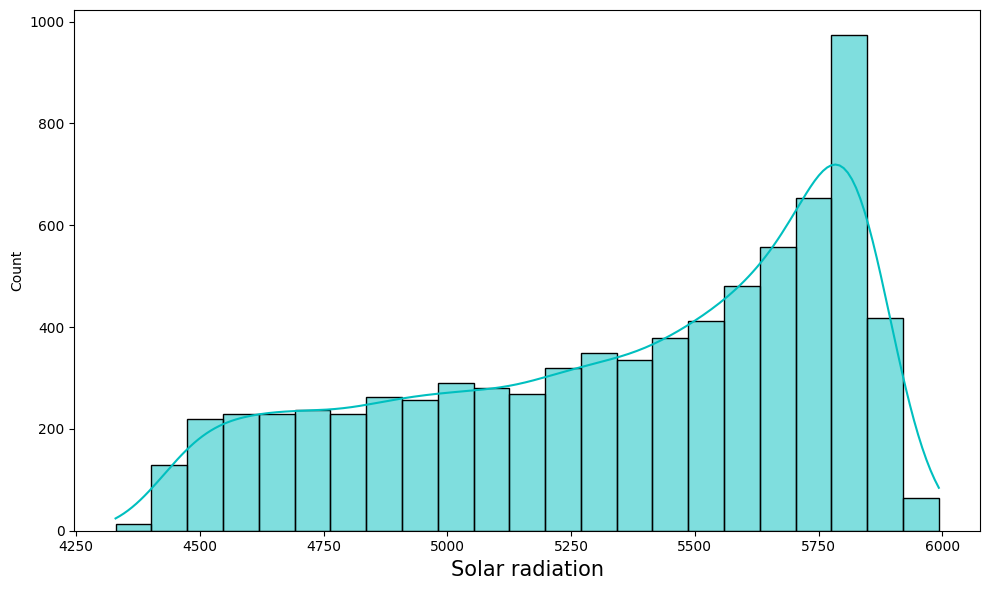

Minimum 4329.520508
Maximum 5992.895996


In [36]:
numerical_col = ['Solar radiation']

plt.figure(figsize=(10, 6), facecolor='white')
plotnumber = 1

for col in numerical_col:
    if plotnumber <= len(numerical_col):  
        ax = plt.subplot(1, len(numerical_col), plotnumber)
        sns.histplot(df[col], color='c', kde=True)  
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

print('Minimum',df['Solar radiation'].min())
print('Maximum',df['Solar radiation'].max())

- The incoming solar radiation shows a left-skewed distribution, with a minimum value at 4329.52 and maximum values at 5992.89. 
- The majority of its values are concentrated in the range of 5600 to 5850.

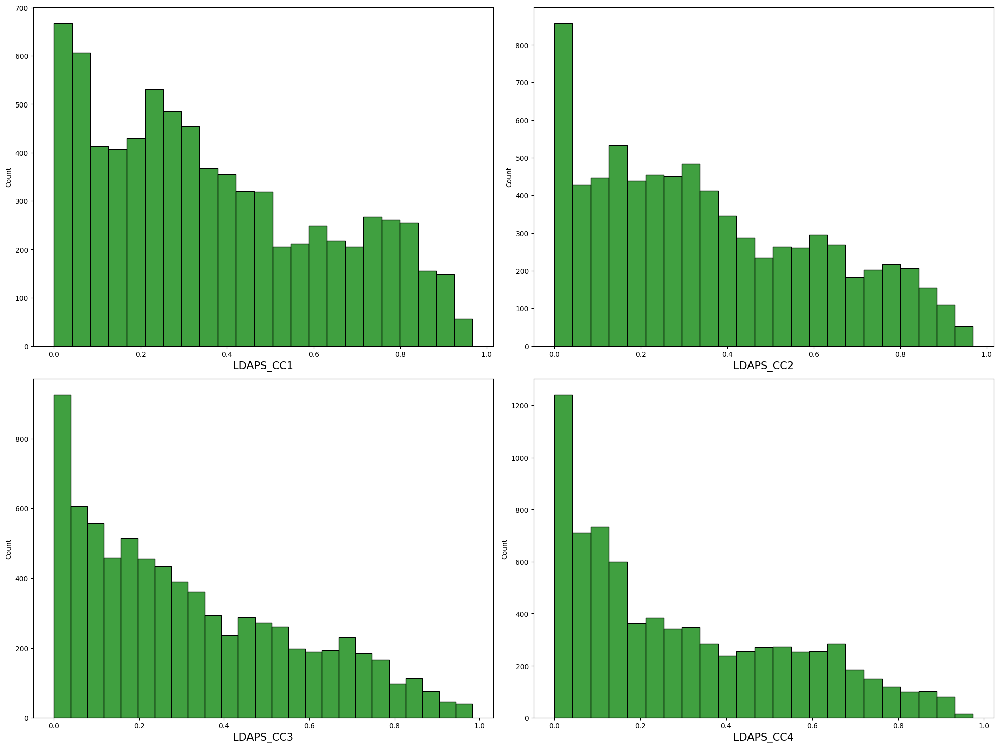

Minimum LDAPS_CC1: 0.0 and Maximum LDAPS_CC1: 0.967277328
Minimum LDAPS_CC2: 0.0 and Maximum LDAPS_CC2: 0.96835306
Minimum LDAPS_CC3: 0.0 and Maximum LDAPS_CC3: 0.983788755
Minimum LDAPS_CC4: 0.0 and Maximum LDAPS_CC4: 0.974709524


In [37]:
numerical_col = ['LDAPS_CC1','LDAPS_CC2', 'LDAPS_CC3','LDAPS_CC4']

plt.figure(figsize=(20,15),facecolor='white')
plotnumber=1

for col in numerical_col:
    if plotnumber <=4:
        ax=plt.subplot(2,2,plotnumber)
        sns.histplot(df[col],color = 'g')
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()
plt.show()

for col in ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']:
    print('Minimum {}: {} and Maximum {}: {}'.format(col, df[col].min(), col, df[col].max()))

- The cloud cover data exhibits a right-skewed distribution.
- The majority of values across all the splits are concentrated near 0.

Minimum LDAPS_PPT1: 0.0 and Maximum LDAPS_PPT1: 23.70154408
Minimum LDAPS_PPT2: 0.0 and Maximum LDAPS_PPT2: 21.62166078
Minimum LDAPS_PPT3: 0.0 and Maximum LDAPS_PPT3: 15.84123484
Minimum LDAPS_PPT4: 0.0 and Maximum LDAPS_PPT4: 16.65546921


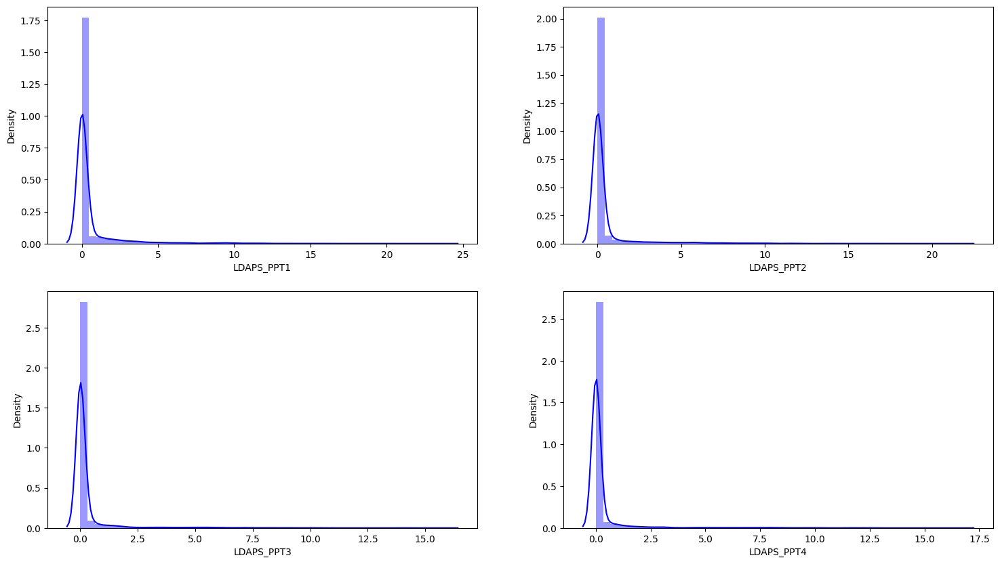

In [38]:
precipitation = ['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']

fig, ax = plt.subplots(2, 2, figsize=(18, 10))
row = 0
col = 0

for i, variable in enumerate(precipitation):
    if i % 2 == 0 and i > 0:
        row += 1
        col = 0
    
    sns.distplot(df[variable], color='b', ax=ax[row, col])
    col += 1
    
for col in ['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']:
    print('Minimum {}: {} and Maximum {}: {}'.format(col, df[col].min(), col, df[col].max()))

- The precipitation data across variables (LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4), exhibits a right-skewed distribution.
- The majority of values for all the splits are concentrated near 0.

### Bivariate Analysis

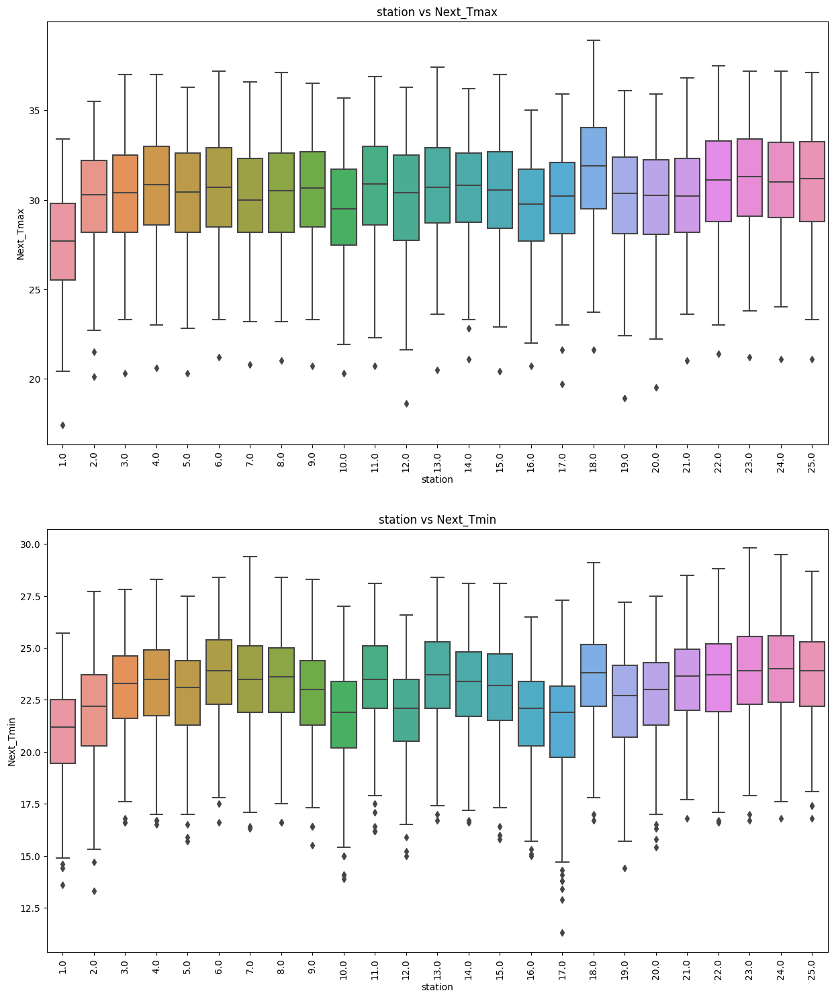

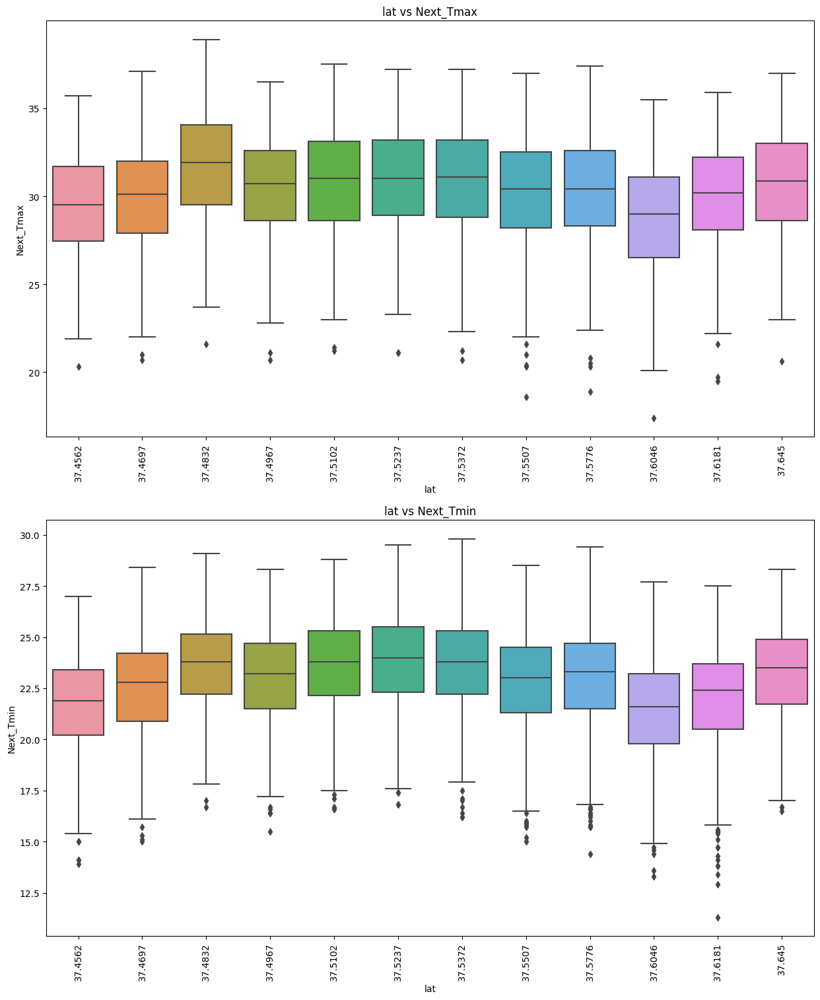

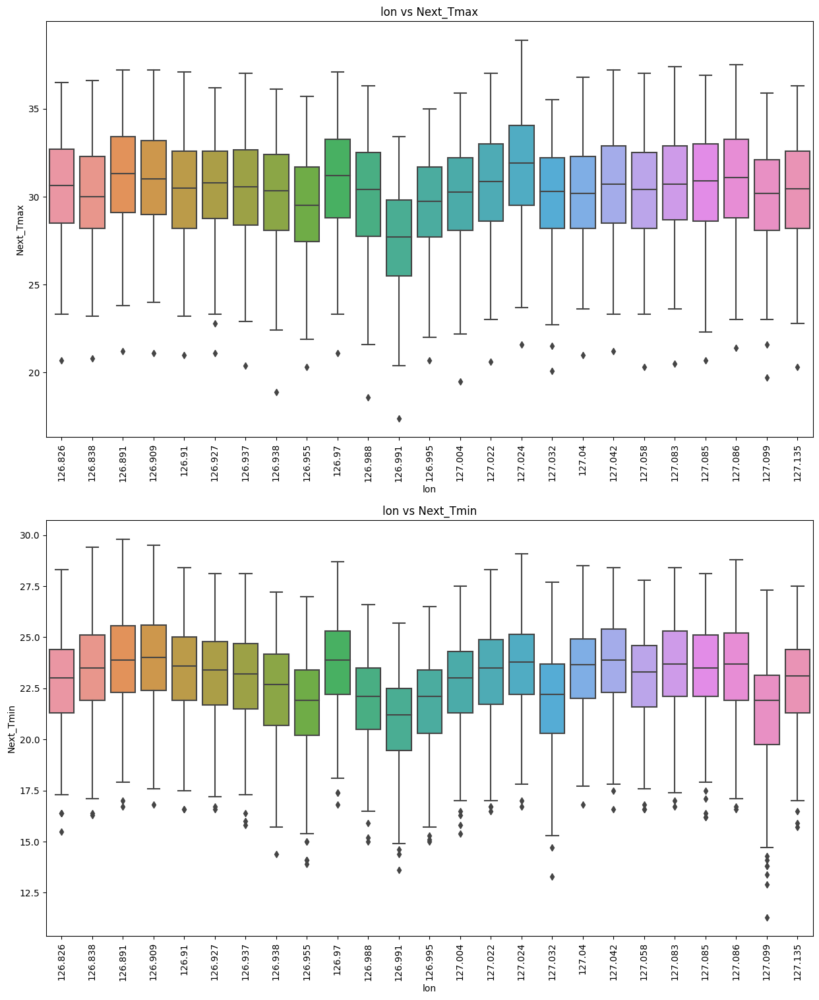

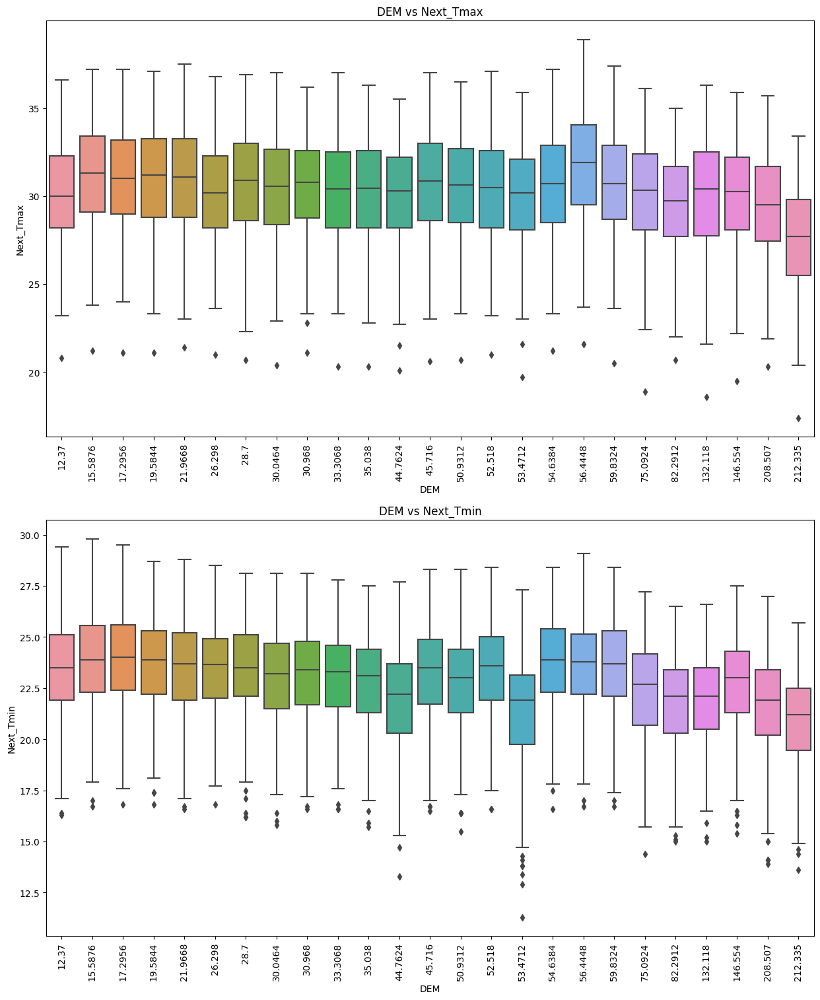

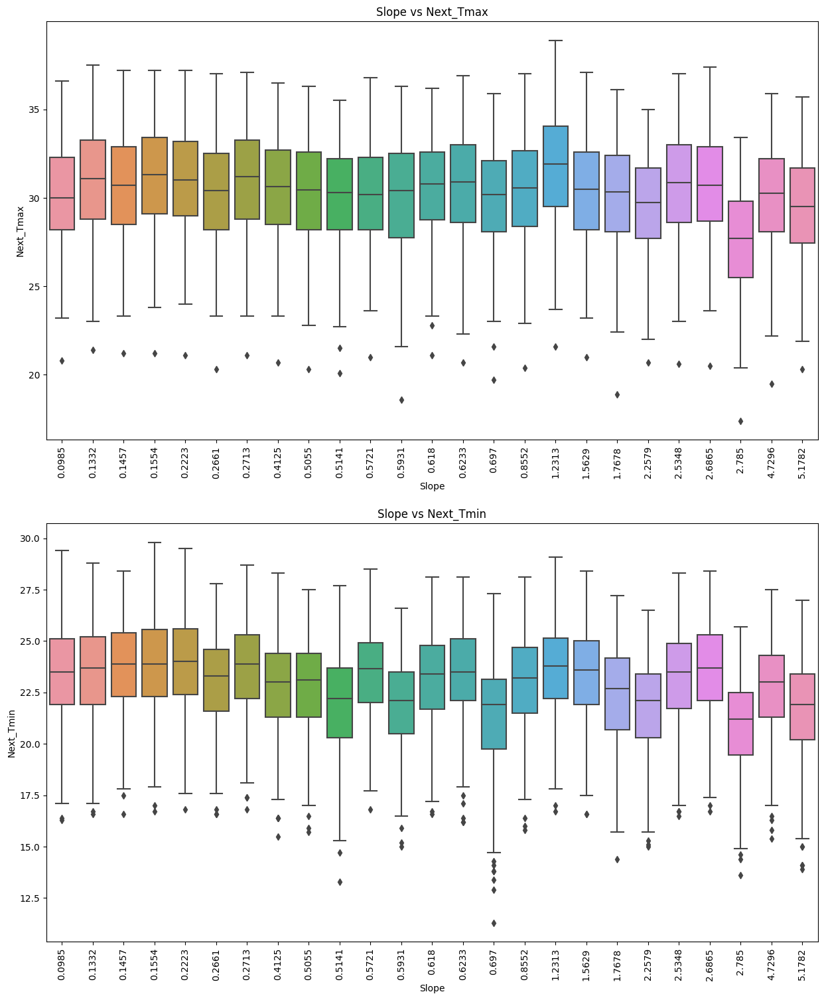

In [39]:
variables = ['station', 'lat', 'lon', 'DEM', 'Slope']
target_variables = ['Next_Tmax', 'Next_Tmin']

for var in variables:
    plt.figure(figsize=(15, 18))
    for target_var in target_variables:
        plt.subplot(2, 1, target_variables.index(target_var) + 1)
        sns.boxplot(x=var, y=target_var, data=df)
        plt.xticks(rotation=90)
        plt.title(f'{var} vs {target_var}')
    plt.show()

    

- Station 18 records the highest temperatures for both Tmax and Tmin, while Station 1 observes the lowest temperatures, potentially influenced by their respective locations.

- The temperature tends to decrease with increasing latitude, aligning with known geographical patterns. Notably, the highest Tmax occurs at 37.645, though this pattern is not mirrored in Tmin, suggesting additional factors influencing temperature.

- Contrary to common belief, longitude appears to influence temperature in the initial longitudes, increasing for the first 4 and decreasing for the next 5. This fluctuation continues in subsequent longitudes.

- While conventional wisdom indicates temperature decreases with elevation, our graph for the last 10 high elevations reveals inconsistencies. Other features may contribute to temperature variations beyond elevation alone.

- The graph illustrates that steeper slopes undergo more rapid temperature changes than gentler ones. This is evident in the consecutive slopes 0.697 and 0.8552, where the lowest and highest temperatures are observed, respectively.

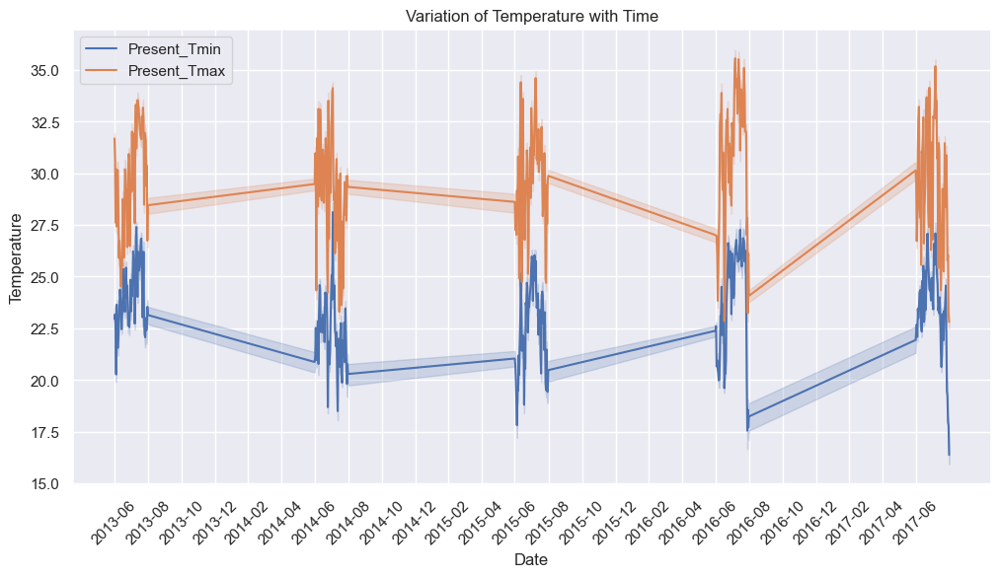

In [40]:
sns.set(style="darkgrid")

plt.figure(figsize=(12, 6))

sns.lineplot(data=df, x='Date', y='Present_Tmin', label='Present_Tmin')
sns.lineplot(data=df, x='Date', y='Present_Tmax', label='Present_Tmax')

plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M'), 
           [date.strftime('%Y-%m') for date in pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M')])

plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Temperature')
plt.title('Variation of Temperature with Time')

plt.legend()
plt.show()


- The graph shows the variation of temperature with time over a period of 4 years (2013 to 2017). The temperature is measured in degrees Celsius (°C).

- The graph shows a clear trend of increasing temperature over time. The minimum temperature (Present_Tmin) has increased from 17.5°C in 2013 to 22.5°C in 2017. The maximum temperature (Present_Tmax) has increased from 27.5°C in 2013 to 32.5°C in 2017.

- The average temperature has also increased over time. In 2013, the average temperature was 22.5°C. In 2017, the average temperature was 27.5°C. This represents an increase of 5°C over a period of 4 years.

- The graph also shows a seasonal variation in temperature. The temperature is highest in the summer months (May to June) and lowest in the winter months (December to January).

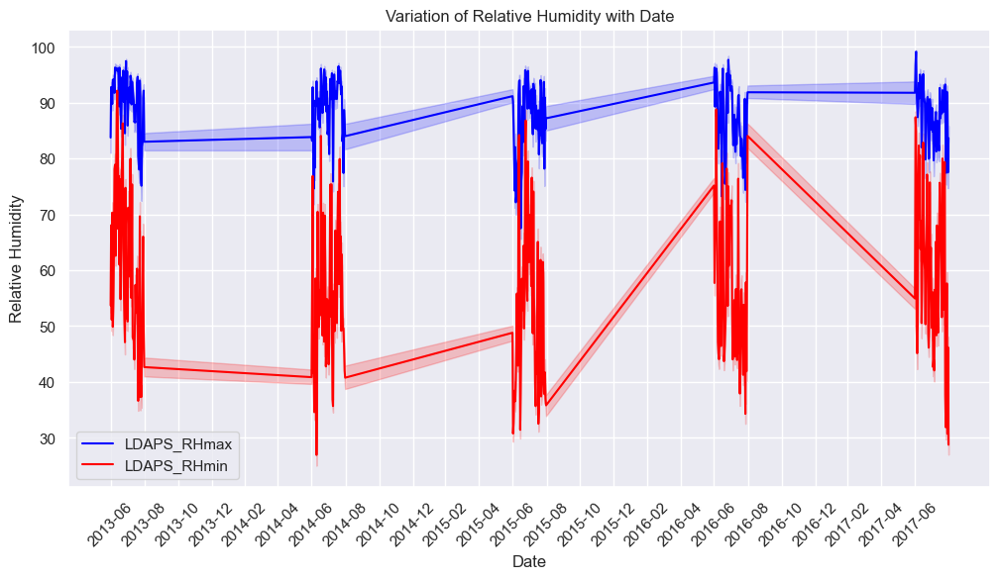

In [41]:
sns.set(style="darkgrid")
plt.figure(figsize=(12, 6))

sns.lineplot(data=df, x='Date', y='LDAPS_RHmax', label='LDAPS_RHmax', color='blue')
sns.lineplot(data=df, x='Date', y='LDAPS_RHmin', label='LDAPS_RHmin', color='red')


plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M'), 
           [date.strftime('%Y-%m') for date in pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M')])

plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Relative Humidity')
plt.title('Variation of Relative Humidity with Date')

plt.legend()
plt.show()

- The graph shows a clear trend of decreasing relative humidity over time. The maximum relative humidity (LDAPS_RHmax) has decreased from 90% in 2013 to 70% in 2017. The minimum relative humidity (LDAPS_RHmin) has decreased from 40% in 2013 to 30% in 2017.

- The average relative humidity has also decreased over time. In 2013, the average relative humidity was 75%. In 2017, the average relative humidity was 55%. This represents a decrease of 15% over a period of 4 years.

- The graph also shows a seasonal variation in relative humidity. The relative humidity is highest in the monsoon season (June to September)

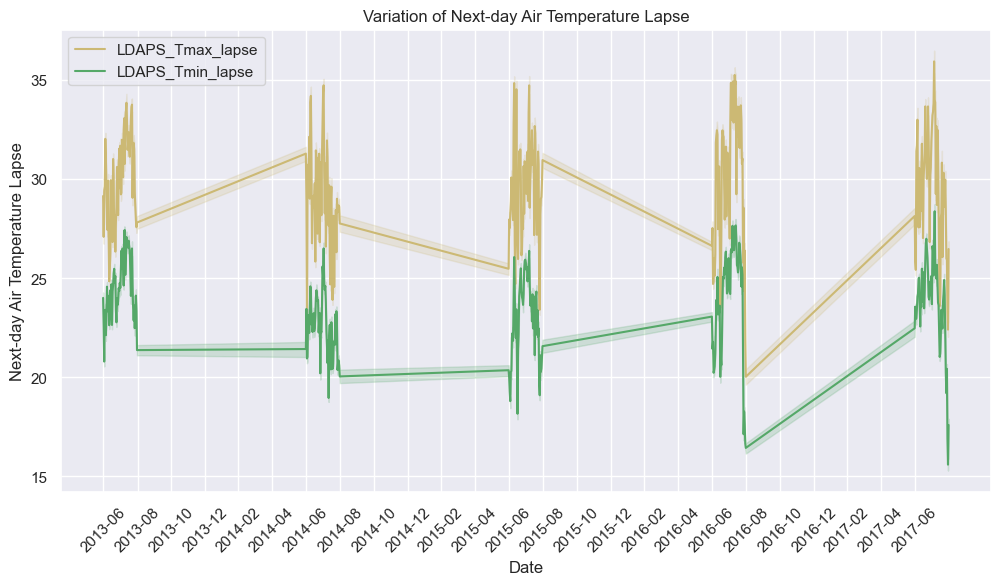

In [42]:
sns.set(style="darkgrid")

plt.figure(figsize=(12, 6))

sns.lineplot(data=df, x='Date', y='LDAPS_Tmax_lapse', label='LDAPS_Tmax_lapse', color='y')
sns.lineplot(data=df, x='Date', y='LDAPS_Tmin_lapse', label='LDAPS_Tmin_lapse', color='g')

plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M'), 
           [date.strftime('%Y-%m') for date in pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M')])

plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Next-day Air Temperature Lapse')
plt.title('Variation of Next-day Air Temperature Lapse')

plt.legend()
plt.show()


- The graph shows the variation of air temperature lapse (LDAPS_Tmax_lapse and LDAPS_Tmin_lapse) with date over a period of 4 years (2013 to 2017)

- The graph LDAPS_Tmax_lapse shows a clear trend of variation air temperature lapse over time. 

- The graph LDAPS_Tmin_lapse shows a clear trend of variation air temperature lapse over time, being steady from 2013 to 2015 and slight increase from 2015-2016 and sudden increase from 2016-17.

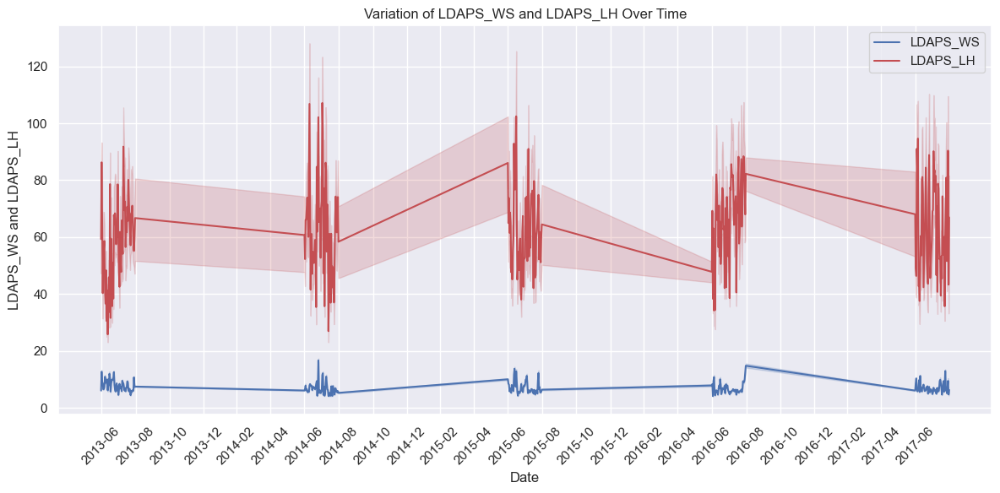

In [43]:
sns.set(style="darkgrid")
plt.figure(figsize=(12, 6))


sns.lineplot(data=df, x='Date', y='LDAPS_WS', label='LDAPS_WS', color='b')
sns.lineplot(data=df, x='Date', y='LDAPS_LH', label='LDAPS_LH', color='r')


plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M'), 
           [date.strftime('%Y-%m') for date in pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M')])


plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('LDAPS_WS and LDAPS_LH')
plt.title('Variation of LDAPS_WS and LDAPS_LH Over Time')

plt.legend()
plt.tight_layout()
plt.show()


- LDAPS_LH is relatively stable throughout the years, with a slight increase in 2016-17. 
- LDAPS_WS shows increase and decrease patterns.
- LDAPS_WS is generally higher than LDAPS_LH. This indicates that more energy is being used to evaporate water than to heat the air.
- There is a increase in LDAPS_WS in 2015 and later it decreased in further years over time.

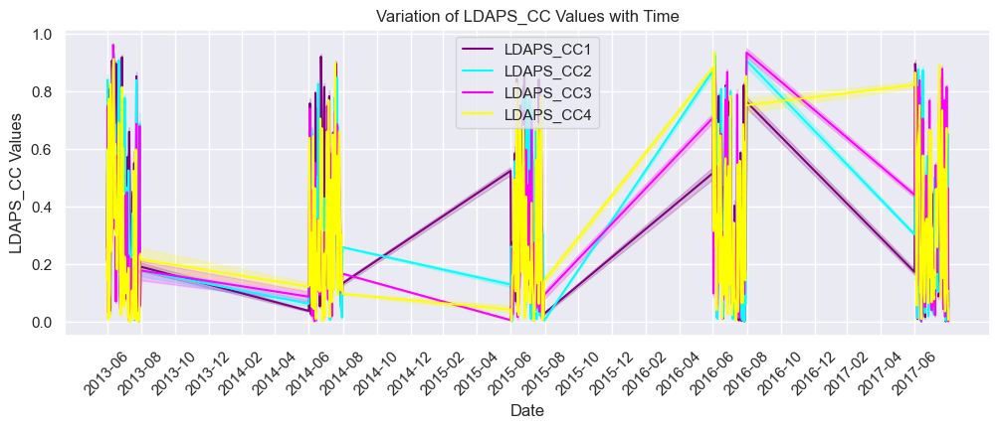

In [44]:
sns.set(style="darkgrid")
plt.figure(figsize=(12, 4))


colors = ['purple', 'cyan', 'magenta', 'yellow']

for i, column in enumerate(['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']):
    sns.lineplot(data=df, x='Date', y=column, label=column, color=colors[i])

plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M'), 
           [date.strftime('%Y-%m') for date in pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M')])

plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('LDAPS_CC Values')
plt.title('Variation of LDAPS_CC Values with Time')

plt.legend()
plt.show()


- The graph shows the variation of cloud cover (CC) with time over a period of 4 years (2013 to 2017) 
- In 2014 LDAPS_CC1 has max cloud cover

- The graph shows a clear trend of increasing cloud cover over time from 2015 to 2016.
- But from 2016 to 17 LDAPS_CC4 has increased 

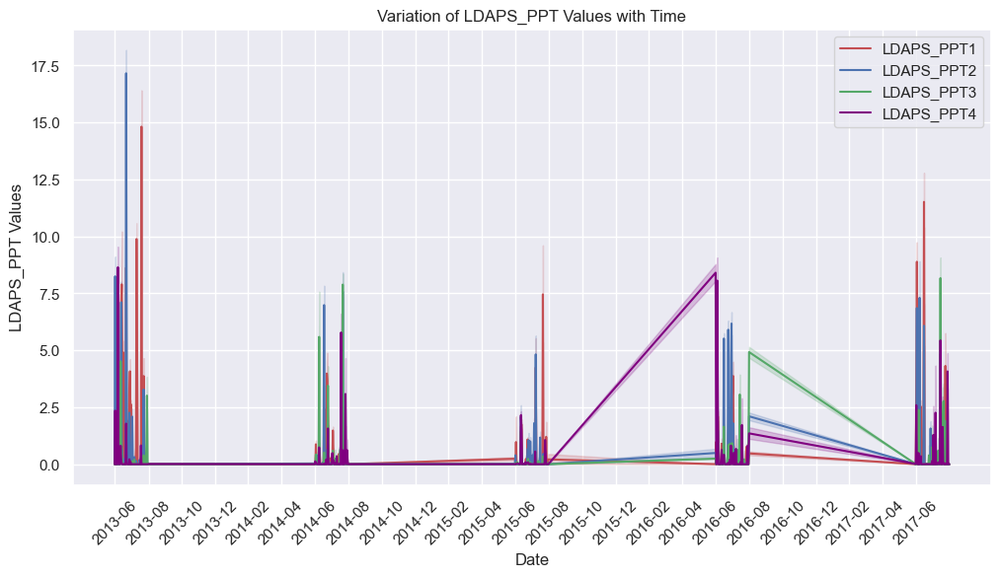

In [45]:
sns.set(style="darkgrid")
plt.figure(figsize=(12, 6))


colors = ['r', 'b', 'g', 'purple']

for i, column in enumerate(['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']):
    sns.lineplot(data=df, x='Date', y=column, label=column, color=colors[i])

plt.xticks(pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M'), 
           [date.strftime('%Y-%m') for date in pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='2M')])

plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('LDAPS_PPT Values')
plt.title('Variation of LDAPS_PPT Values with Time')

plt.legend()
plt.show()


- 2013: The temperature fluctuations remained relatively steady throughout the year,
- 2014: Temperature fluctuations started to rise which is not noticable change
- 2015: LDAPS_PPT3 has increase drastically 
- 2016: Temperature fluctuations continued to ascend 
- 2017: The pattern of rising temperature fluctuations persisted 

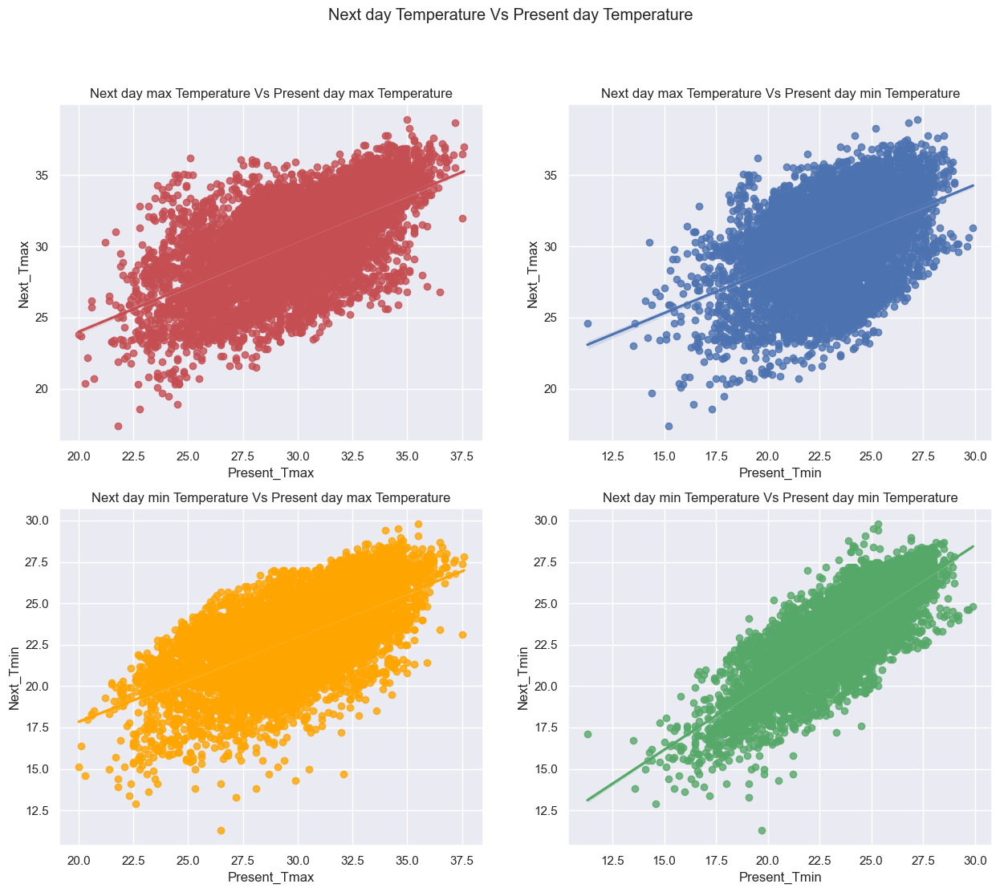

In [46]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Temperature Vs Present day Temperature')

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Present day max Temperature')
sns.regplot(x='Present_Tmax',y='Next_Tmax',data=df,color='r')

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs Present day min Temperature')
sns.regplot(x='Present_Tmin',y='Next_Tmax',data=df,color='b')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs Present day max Temperature')
sns.regplot(x='Present_Tmax',y='Next_Tmin',data=df,color='orange')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs Present day min Temperature')
sns.regplot(x='Present_Tmin',y='Next_Tmin',data=df,color='g')
plt.show()

 - A strong positive correlation of next day max  temperature with the present day maximum temperature
 - A strong positive correlation of next day max temperature with the present day  minimum temperature
 - A strong positive correlation of next day min temperature with the present day  maximum temperature
 - A strong positive correlation of next day min temperature with the present day  maximum temperature
 

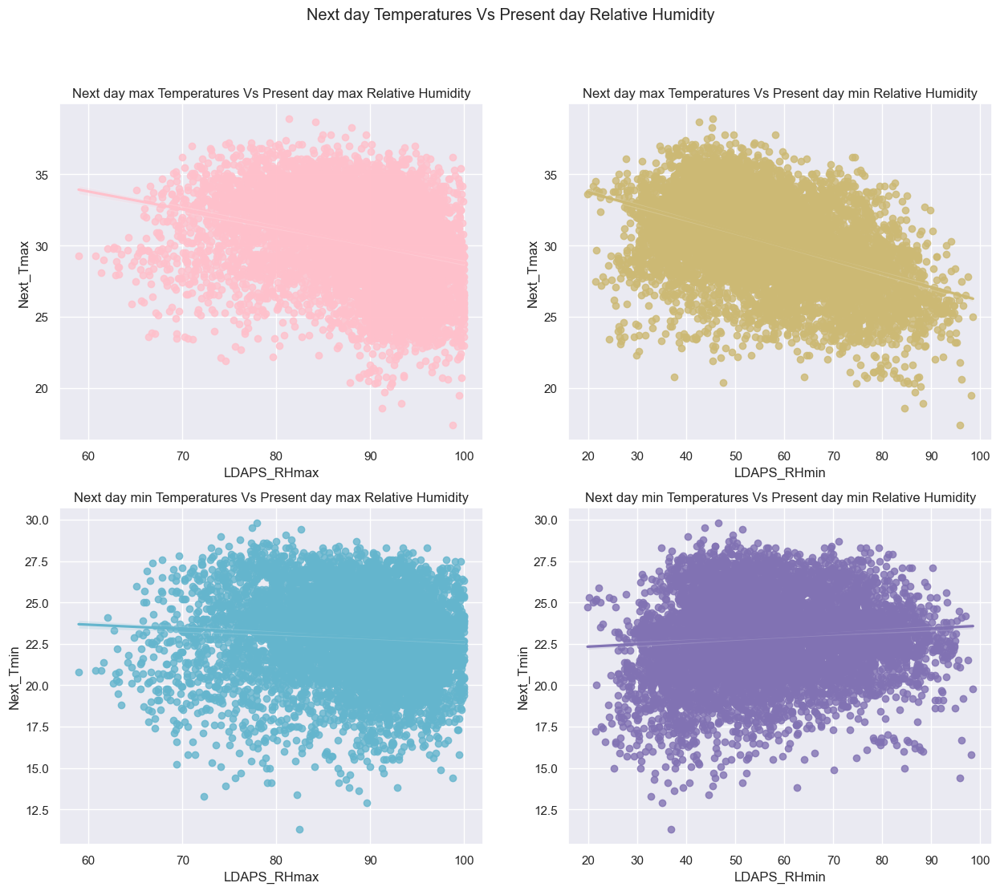

In [47]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Temperatures Vs Present day Relative Humidity')

plt.subplot(2,2,1)
plt.title('Next day max Temperatures Vs Present day max Relative Humidity')
sns.regplot(x='LDAPS_RHmax',y='Next_Tmax',data=df,color='pink')

plt.subplot(2,2,2)
plt.title('Next day max Temperatures Vs Present day min Relative Humidity')
sns.regplot(x='LDAPS_RHmin',y='Next_Tmax',data=df,color='y')

plt.subplot(2,2,3)
plt.title('Next day min Temperatures Vs Present day max Relative Humidity')
sns.regplot(x='LDAPS_RHmax',y='Next_Tmin',data=df,color='c')

plt.subplot(2,2,4)
plt.title('Next day min Temperatures Vs Present day min Relative Humidity')
sns.regplot(x='LDAPS_RHmin',y='Next_Tmin',data=df,color='m')
plt.show()

- Next day Tmax decreases with increase in Relative Humidity max and RHmin ie negatively correlated
- while it seems to be very slight or no changes by Rhmax with Next_Tmin and shows a slight positive correlation with Rhmin.

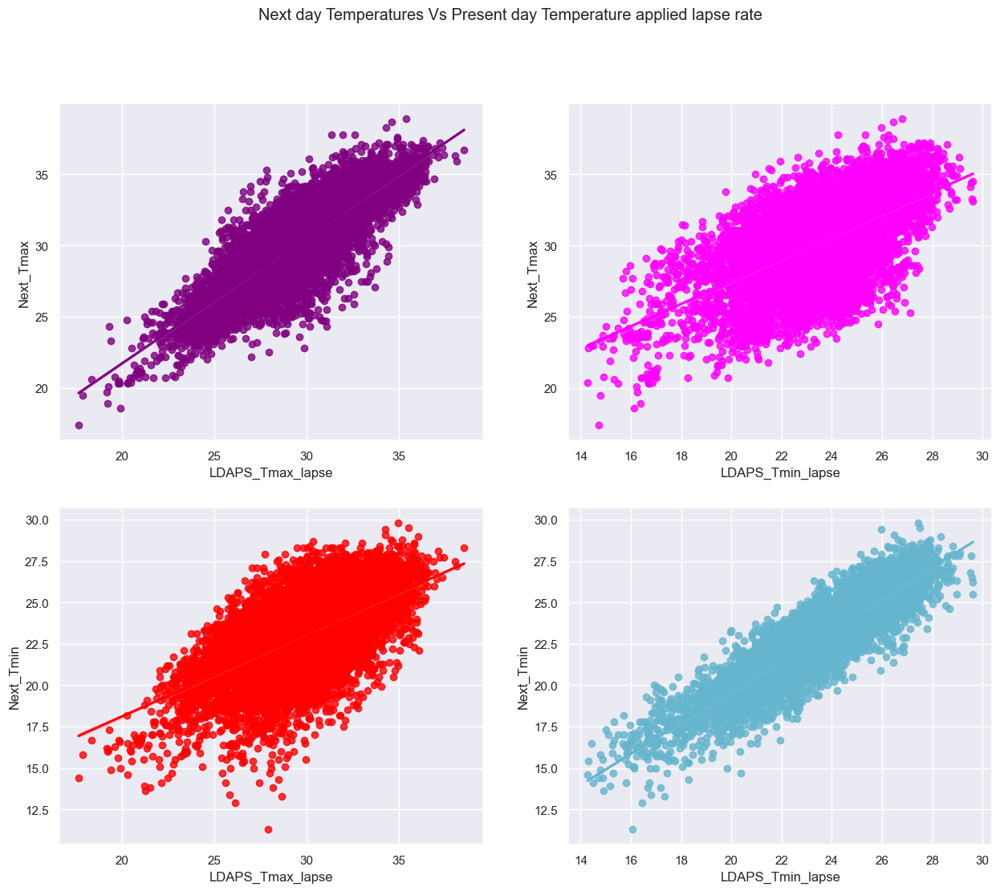

In [48]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Temperatures Vs Present day Temperature applied lapse rate')

plt.subplot(2,2,1)
sns.regplot(x='LDAPS_Tmax_lapse',y='Next_Tmax',data=df,color='purple')

plt.subplot(2,2,2)
sns.regplot(x='LDAPS_Tmin_lapse',y='Next_Tmax',data=df,color='magenta')

plt.subplot(2,2,3)
sns.regplot(x='LDAPS_Tmax_lapse',y='Next_Tmin',data=df,color='red')

plt.subplot(2,2,4)
sns.regplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df,color='c')
plt.show()

- There is strong positive correlation of Next day temperatures with the present day temperatures  lapse rate. If one increases other also increases.

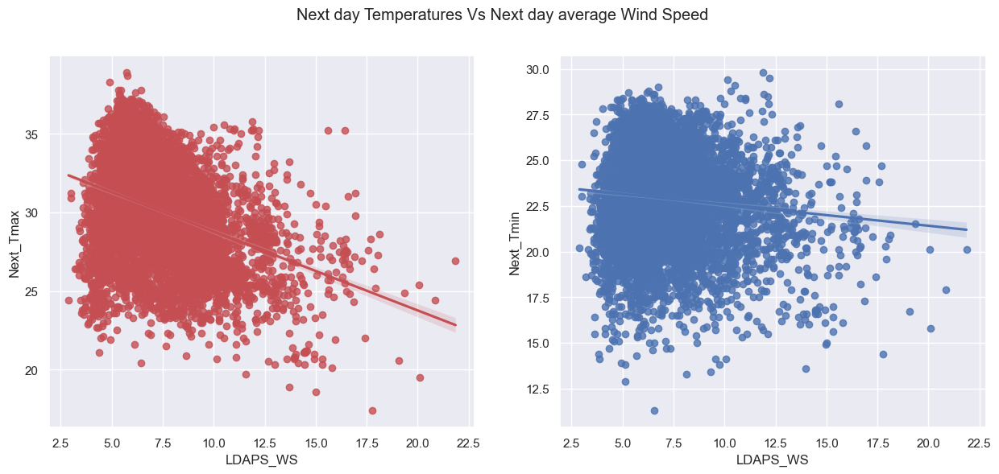

In [49]:
plt.figure(figsize=(15,6))
plt.suptitle('Next day Temperatures Vs Next day average Wind Speed')

plt.subplot(1,2,1)
sns.regplot(x='LDAPS_WS',y='Next_Tmax',data=df,color='r')

plt.subplot(1,2,2)
sns.regplot(x='LDAPS_WS',y='Next_Tmin',data=df,color='b')
plt.show()

- Temperarue decreases as the wind speed increases.
- Tmax seem to decrease more drastically than Tmin.

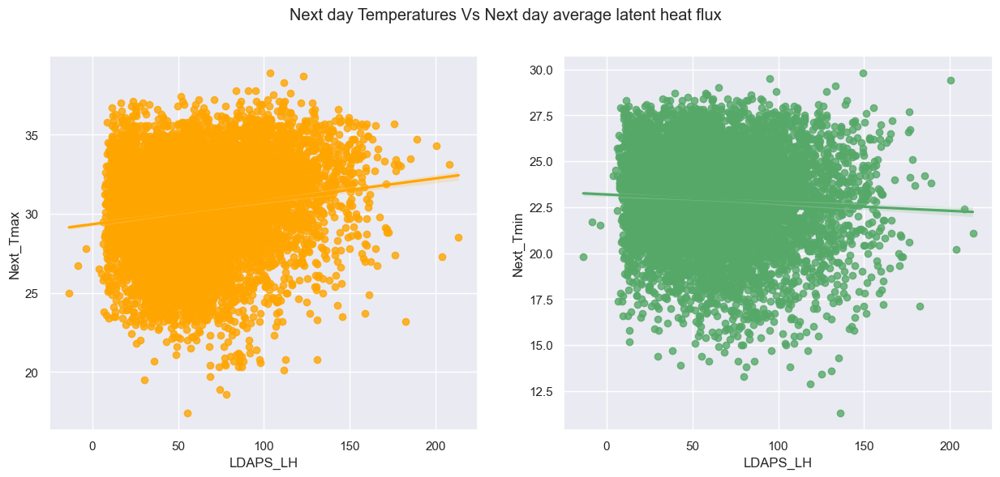

In [50]:
plt.figure(figsize=(15,6))
plt.suptitle('Next day Temperatures Vs Next day average latent heat flux')

plt.subplot(1,2,1)
sns.regplot(x='LDAPS_LH',y='Next_Tmax',data=df,color='orange')

plt.subplot(1,2,2)
sns.regplot(x='LDAPS_LH',y='Next_Tmin',data=df,color='g')
plt.show()

- As Latent heat flux increases Tmax also increases while Tmin decreases. 
- Latent heat flux seem to bring out extremes of temperature with its increase.

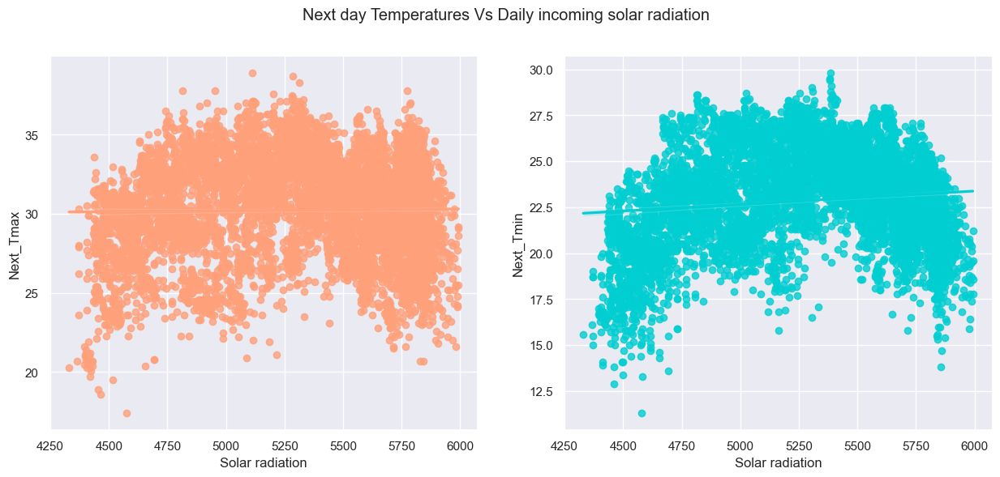

In [51]:
plt.figure(figsize=(15,6))
plt.suptitle('Next day Temperatures Vs Daily incoming solar radiation')

plt.subplot(1,2,1)
sns.regplot(x='Solar radiation',y='Next_Tmax',data=df,color='#FFA07A')

plt.subplot(1,2,2)
sns.regplot(x='Solar radiation',y='Next_Tmin',data=df,color='#00CED1')
plt.show()

- Solar radiation does not seem to affect Tmax or Tmin even though studies have shown that Air temperatures have their origin in the absorption of radiant energy from the Sun.

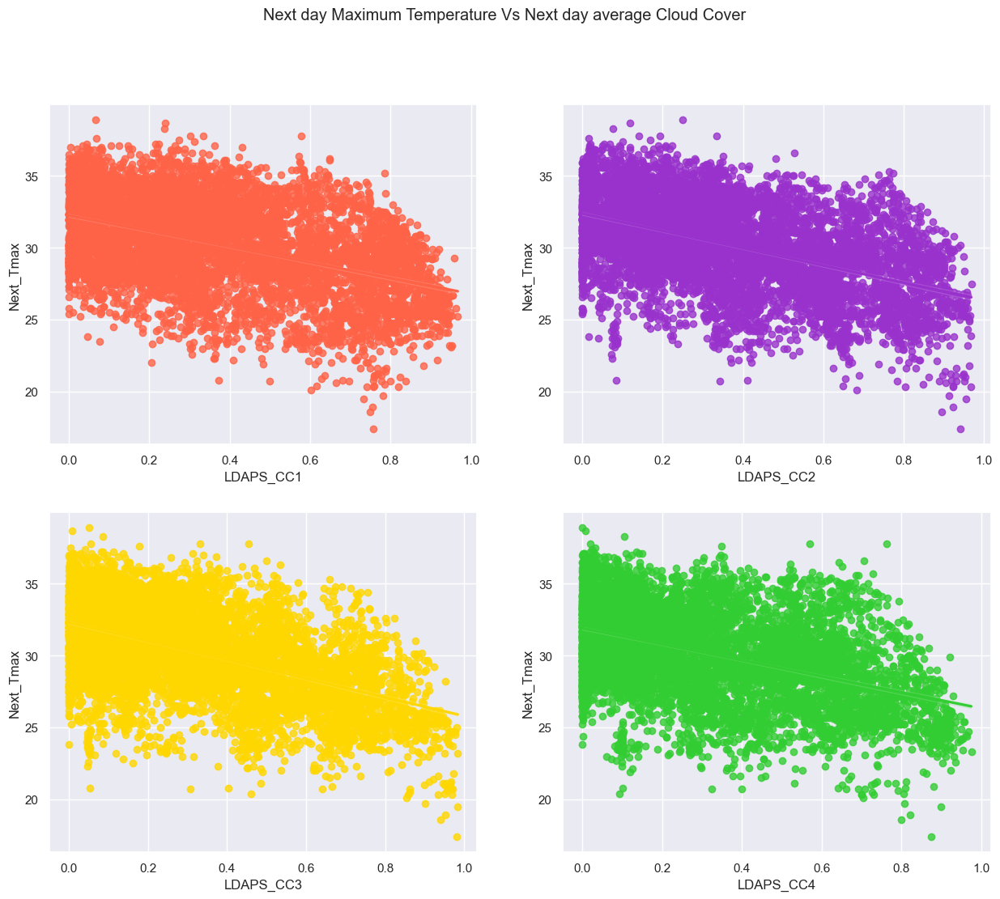

In [52]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Maximum Temperature Vs Next day average Cloud Cover')

plt.subplot(2,2,1)
sns.regplot(x='LDAPS_CC1',y='Next_Tmax',data=df,color='#FF6347')

plt.subplot(2,2,2)
sns.regplot(x='LDAPS_CC2',y='Next_Tmax',data=df,color='#9932CC')

plt.subplot(2,2,3)
sns.regplot(x='LDAPS_CC3',y='Next_Tmax',data=df,color='#FFD700')

plt.subplot(2,2,4)
sns.regplot(x='LDAPS_CC4',y='Next_Tmax',data=df,color='#32CD32')
plt.show()

- Tmax decreases as the cloud cover increases irrespective of any split which is also what studies show.

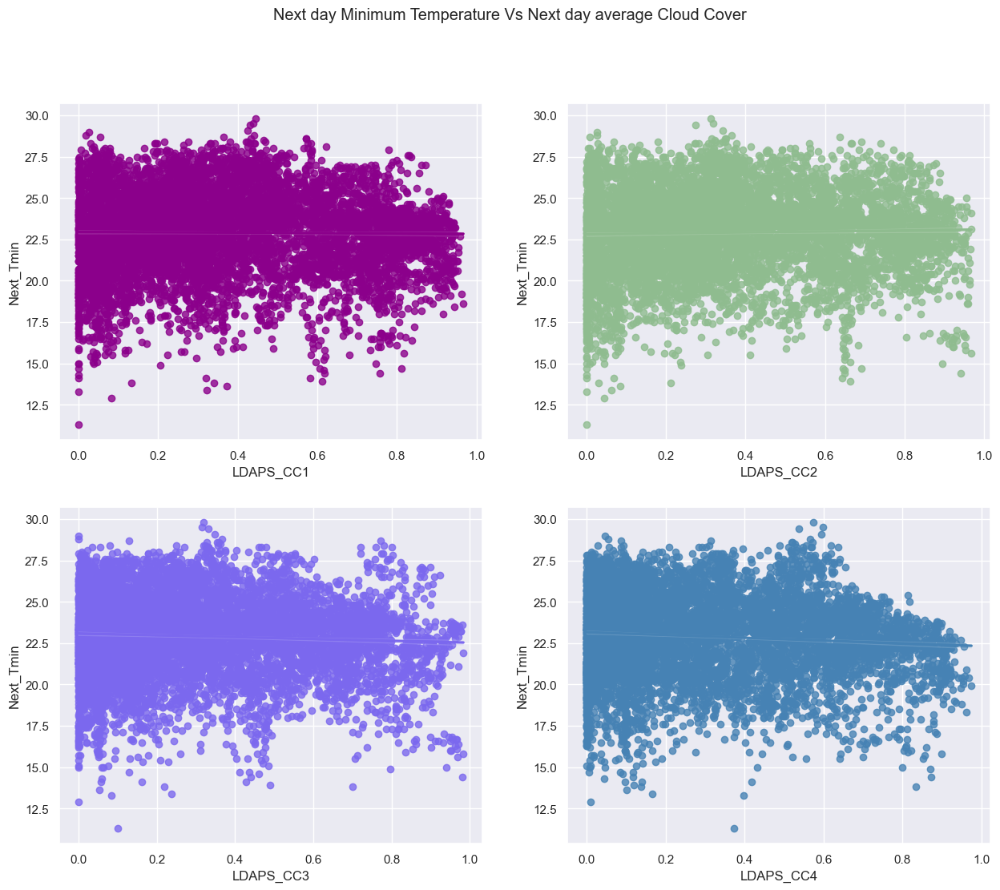

In [53]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Minimum Temperature Vs Next day average Cloud Cover')

plt.subplot(2,2,1)
sns.regplot(x='LDAPS_CC1',y='Next_Tmin',data=df,color='#8B008B')

plt.subplot(2,2,2)
sns.regplot(x='LDAPS_CC2',y='Next_Tmin',data=df,color='#8FBC8F')

plt.subplot(2,2,3)
sns.regplot(x='LDAPS_CC3',y='Next_Tmin',data=df,color='#7B68EE')

plt.subplot(2,2,4)
sns.regplot(x='LDAPS_CC4',y='Next_Tmin',data=df,color='#4682B4')
plt.show()

- Tmin seems to remain unaffeact by cloud cover as cloud cover is also responsible for green house effect which increases the temperature.

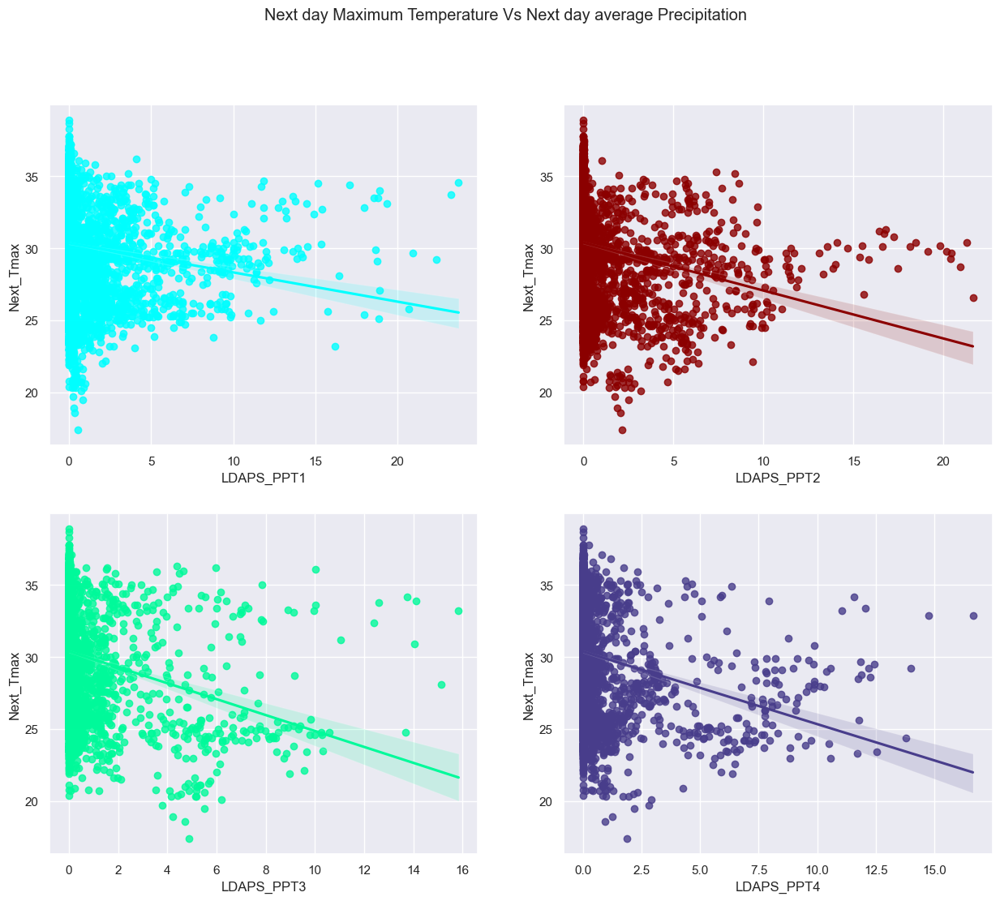

In [54]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Maximum Temperature Vs Next day average Precipitation')

plt.subplot(2,2,1)
sns.regplot(x='LDAPS_PPT1',y='Next_Tmax',data=df,color='#00FFFF')

plt.subplot(2,2,2)
sns.regplot(x='LDAPS_PPT2',y='Next_Tmax',data=df,color='#8B0000')

plt.subplot(2,2,3)
sns.regplot(x='LDAPS_PPT3',y='Next_Tmax',data=df,color='#00FA9A')

plt.subplot(2,2,4)
sns.regplot(x='LDAPS_PPT4',y='Next_Tmax',data=df,color='#483D8B')
plt.show()

- Tmax decreases as the precipitation increases irrespective of any split which is also what studies show.

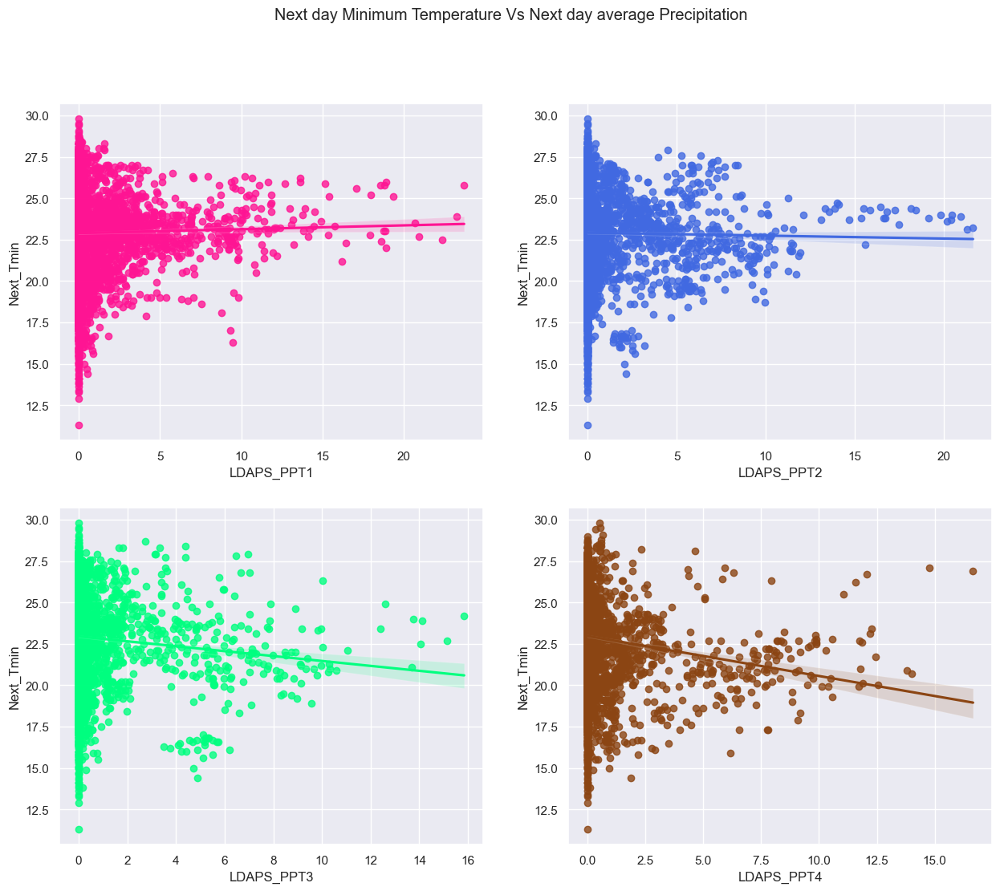

In [55]:
plt.figure(figsize=(15,12))
plt.suptitle('Next day Minimum Temperature Vs Next day average Precipitation')

plt.subplot(2,2,1)
sns.regplot(x='LDAPS_PPT1',y='Next_Tmin',data=df,color='#FF1493')

plt.subplot(2,2,2)
sns.regplot(x='LDAPS_PPT2',y='Next_Tmin',data=df,color='#4169E1')

plt.subplot(2,2,3)
sns.regplot(x='LDAPS_PPT3',y='Next_Tmin',data=df,color='#00FF7F')

plt.subplot(2,2,4)
sns.regplot(x='LDAPS_PPT4',y='Next_Tmin',data=df,color='#8B4513')
plt.show()

- There is very slight hange on increase of precipitation in Tmin. 
- Tmin seem to decrease slightly as the precipitaion increases with later splits.

### Multivariate analysis

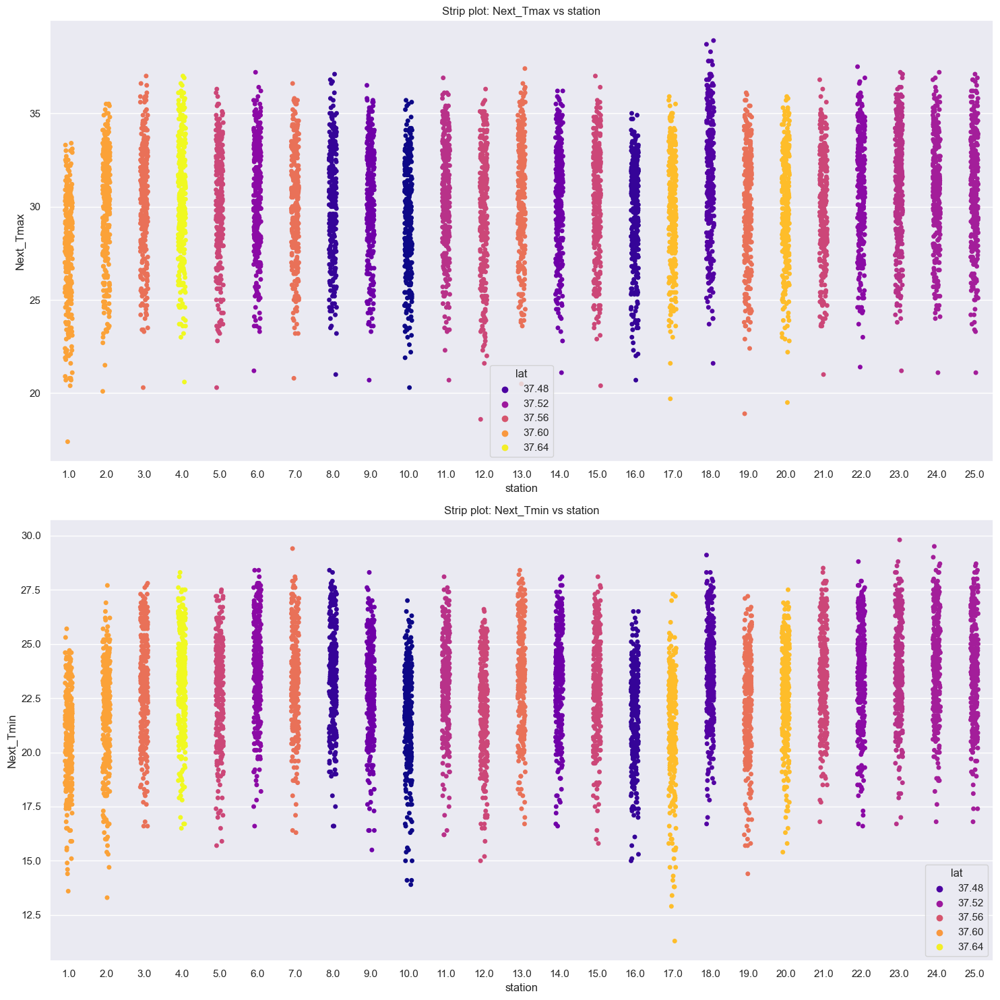

In [56]:
plt.figure(figsize=(15, 15))

plt.subplot(2, 1, 1)
sns.stripplot(x='station', y='Next_Tmax', hue='lat', data=df, palette='plasma', marker='o', edgecolor='w')
plt.title('Strip plot: Next_Tmax vs station')

plt.subplot(2, 1, 2)
sns.stripplot(x='station', y='Next_Tmin', hue='lat', data=df, palette='plasma', marker='o', edgecolor='w')
plt.title('Strip plot: Next_Tmin vs station')

plt.tight_layout()
plt.show()


- Stations are positioned at specific latitudes, with a maximum of three stations per latitude. Additionally, as the latitude decreases, there is an observable rise in temperature.

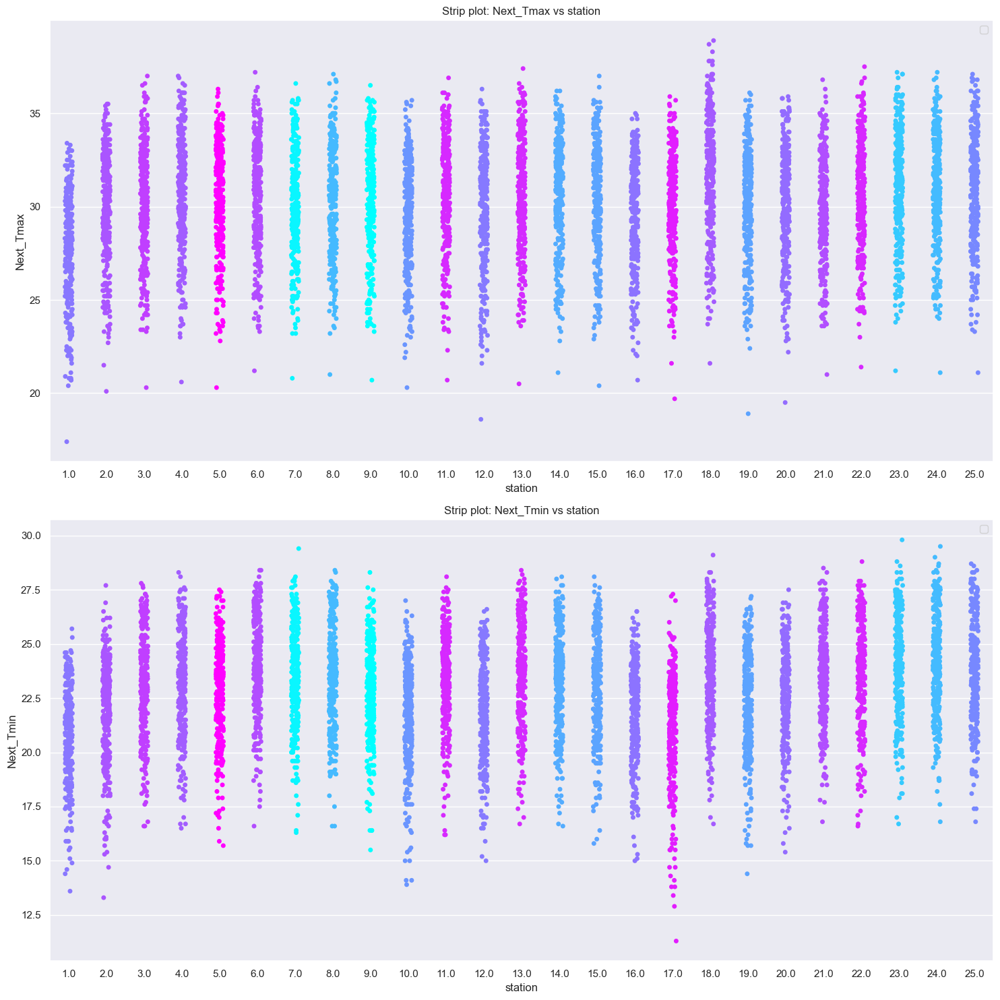

In [57]:
plt.figure(figsize=(15, 15))

variables = ['Next_Tmax', 'Next_Tmin']

for i, var in enumerate(variables, start=1):
    plt.subplot(2, 1, i)
    sns.stripplot(x='station', y=var, hue='lon', data=df, palette='cool', marker='o', edgecolor='w')
    plt.title(f'Strip plot: {var} vs station')
    plt.legend('')

plt.tight_layout()
plt.show()


 - Each station belong to a particular longitude. There is only one statiton belonging to a longitude. As the longitude do not affect the temperatures much the graphs are similar to the station vs latitudes.

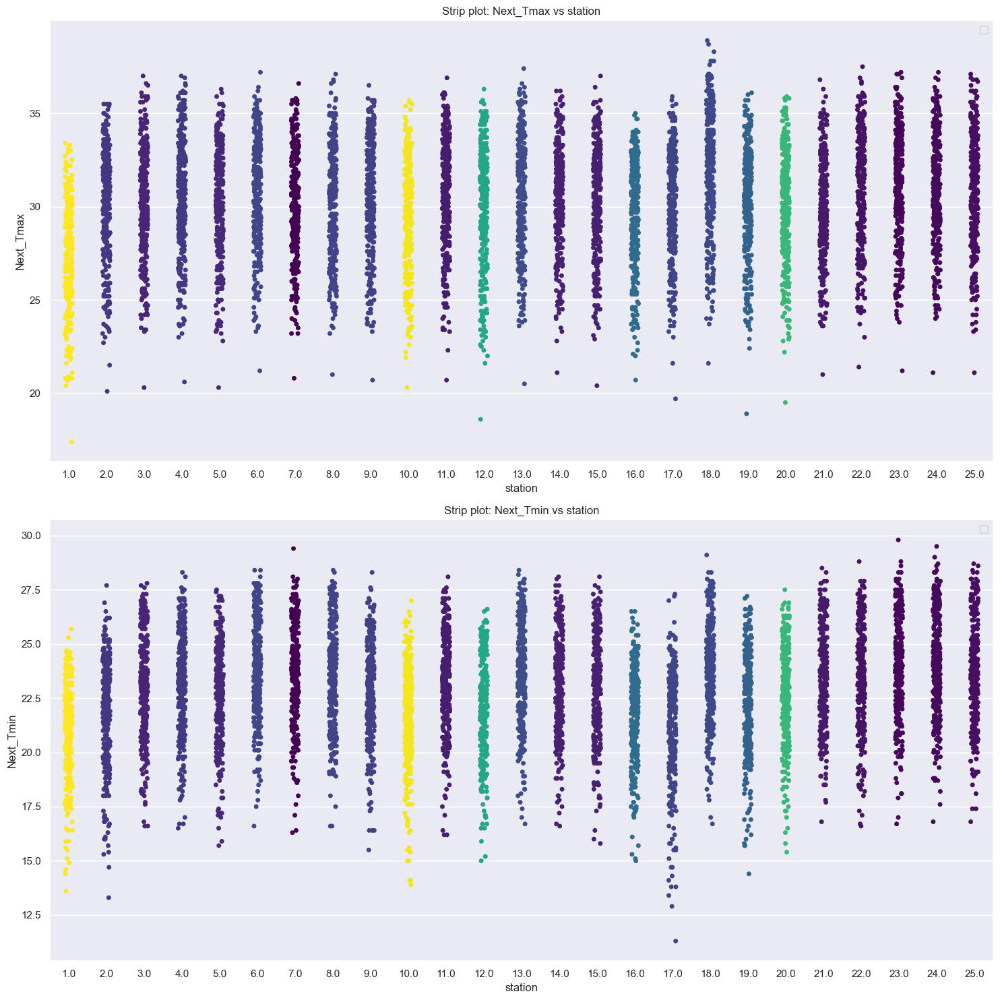

In [58]:
plt.figure(figsize=(15, 15))

variables = ['Next_Tmax', 'Next_Tmin']

for i, var in enumerate(variables, start=1):
    plt.subplot(2, 1, i)
    sns.stripplot(x='station', y=var, hue='DEM', data=df, palette='viridis', marker='o', edgecolor='w')
    plt.title(f'Strip plot: {var} vs station')
    plt.legend('')

plt.tight_layout()
plt.show()


- Each station belong to a particular elevation. There is only one statiton belonging to a particular elevation. Highest tmax is noted at station 18 which have an elevation 56.44 even though it is not the lowest elevation, which indicates that elevation alone does not decide the temperature.

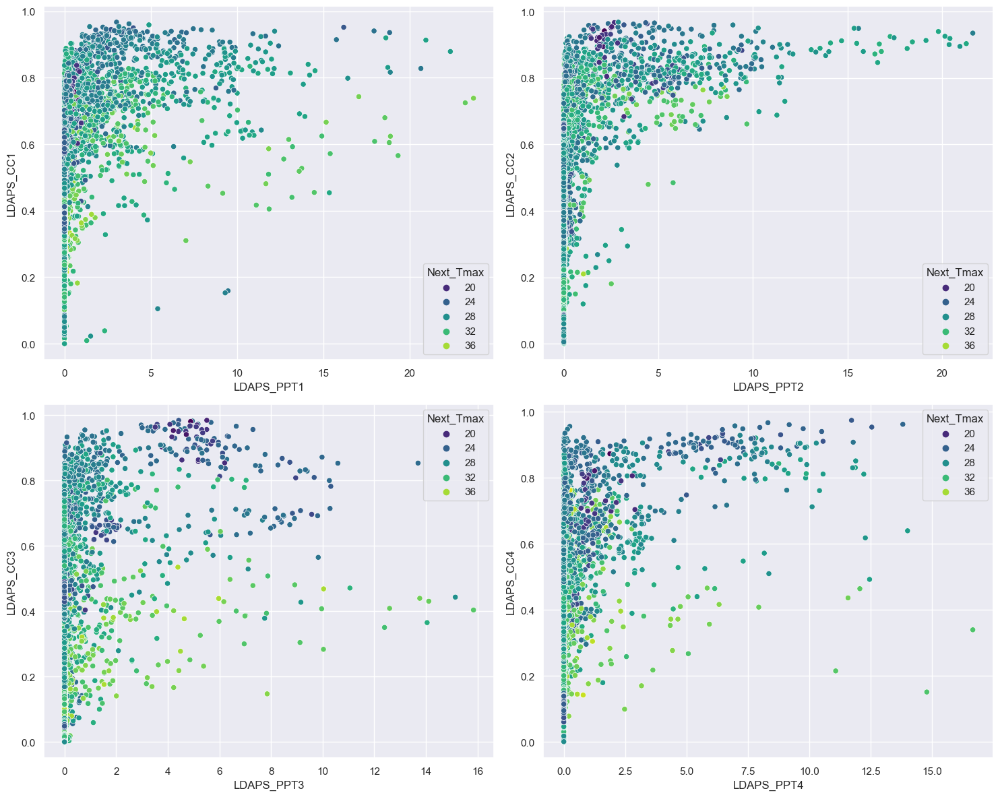

In [59]:
plt.figure(figsize=(15, 12))

variables = ['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']
variables_cc = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']

for i, (ppt_var, cc_var) in enumerate(zip(variables, variables_cc), start=1):
    plt.subplot(2, 2, i)
    sns.scatterplot(x=ppt_var, y=cc_var, hue='Next_Tmax', data=df, palette='viridis', marker='o', edgecolor='w')

plt.tight_layout()
plt.show()


- In the 1st split of cloud cover and precipitaion, precipitation increases after a value of cloud cover crosses 0.3 wjile this threshold increases to 0.5 in 2nd split after that decreases for all the splits. Tmax is higher when there cloud cover and precipitation both have lower value, while presence of outliers are also there.

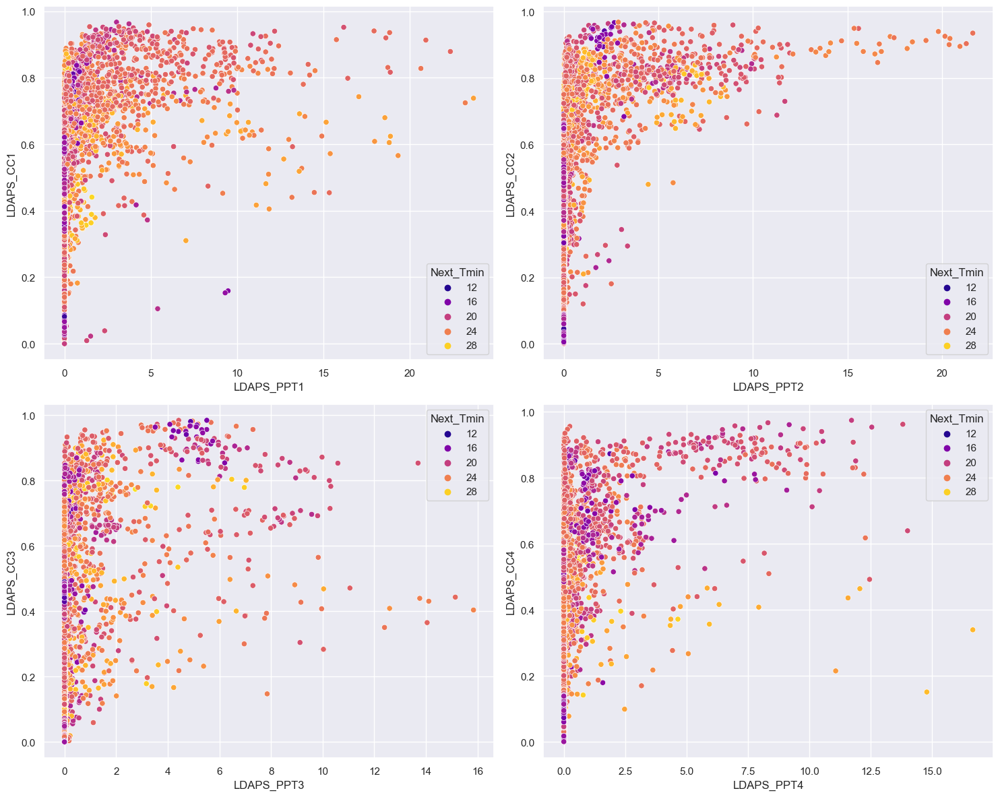

In [60]:
plt.figure(figsize=(15, 12))

variables = ['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']
variables_cc = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']

for i, (ppt_var, cc_var) in enumerate(zip(variables, variables_cc), start=1):
    plt.subplot(2, 2, i)
    sns.scatterplot(x=ppt_var, y=cc_var, hue='Next_Tmin', data=df, palette='plasma', marker='o', edgecolor='w')

plt.tight_layout()
plt.show()


- In the 1st split of cloud cover and precipitaion, precipitation increases after a value of cloud cover crosses 0.3 wjile this threshold increases to 0.5 in 2nd split after that decreases for all the splits. Tmin is higher when there cloud cover and precipitation both have lower value.

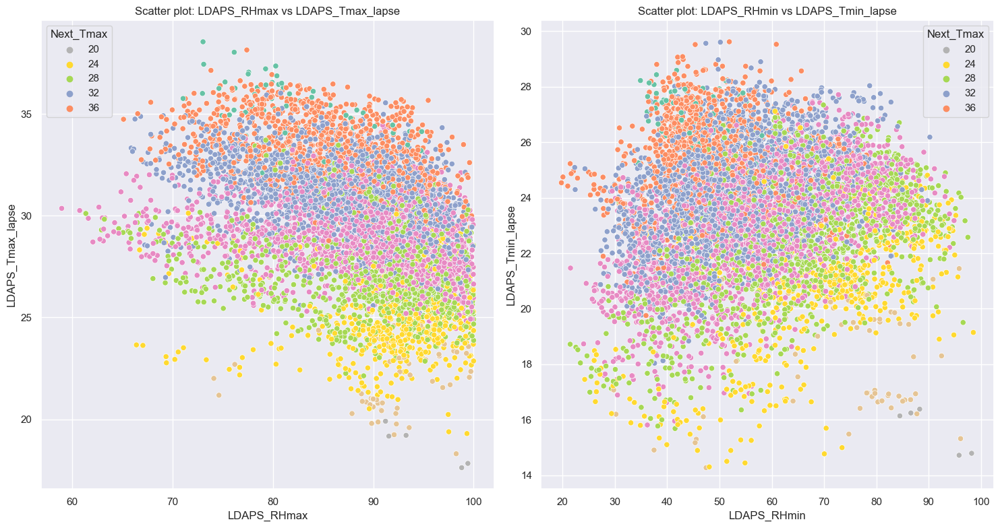

In [61]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
sns.scatterplot(x='LDAPS_RHmax', y='LDAPS_Tmax_lapse', hue='Next_Tmax', data=df, palette='Set2_r', marker='o', edgecolor='w')
plt.title('Scatter plot: LDAPS_RHmax vs LDAPS_Tmax_lapse')

plt.subplot(1, 2, 2)
sns.scatterplot(x='LDAPS_RHmin', y='LDAPS_Tmin_lapse', hue='Next_Tmax', data=df, palette='Set2_r', marker='o', edgecolor='w')
plt.title('Scatter plot: LDAPS_RHmin vs LDAPS_Tmin_lapse')

plt.tight_layout()
plt.show()


- As RHmax increases, Tmax lapse rate decreases and Next day Tmax also seem to decrease while as Rhmin increases Tmin lapse rate also seem to increase but Next dat Tmax decreases

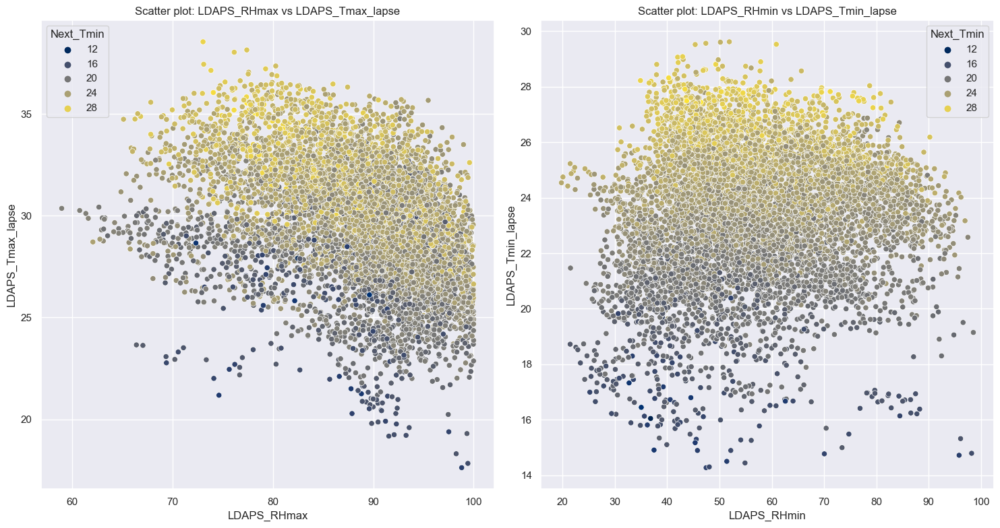

In [62]:
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
sns.scatterplot(x='LDAPS_RHmax', y='LDAPS_Tmax_lapse', hue='Next_Tmin', data=df, palette='cividis', marker='o', edgecolor='w')
plt.title('Scatter plot: LDAPS_RHmax vs LDAPS_Tmax_lapse')

plt.subplot(1, 2, 2)
sns.scatterplot(x='LDAPS_RHmin', y='LDAPS_Tmin_lapse', hue='Next_Tmin', data=df, palette='cividis', marker='o', edgecolor='w')
plt.title('Scatter plot: LDAPS_RHmin vs LDAPS_Tmin_lapse')

plt.tight_layout()
plt.show()


- As RHmax increases, Tmax lapse rate decreases and Next day Tmin also seem to decrease while as Rhmin increases Tmin lapse rate also seem to increase but Next dat Tmin decreases

In [63]:
df.drop(columns = ['Date'],axis=1,inplace=True)

- Date column is dropped to assess the skewness of the data distribution

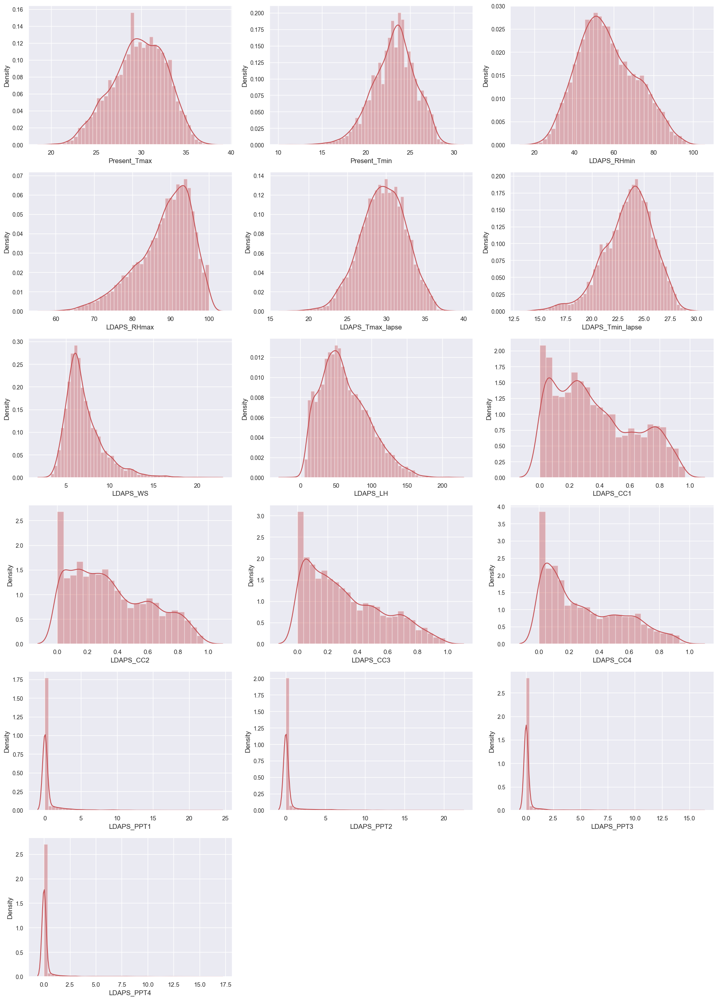

In [64]:
numerical_cols = ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse',
                  'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
                  'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Solar radiation']

plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 16:
        ax = plt.subplot(6, 3, plotnumber)
        sns.distplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

The data exhibits noticeable skewness, particularly in the variables of wind speed, cloud cover, precipitation, relative humidity, and latent heat.

### Encoding

In [65]:
from sklearn.preprocessing import LabelEncoder

def encode_categorical_columns(df, columns):
    """
    Encode categorical columns in a DataFrame using LabelEncoder.

    Parameters:
    - df: DataFrame
    - columns: list of column names to be encoded

    Returns:
    - DataFrame: DataFrame with encoded columns
    - dict: Mapping of label encoders for each column
    """

    label_encoders = {}

    for column in columns:
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
        label_encoders[column] = le

    return df, label_encoders

# Assuming df is your DataFrame, and you want to encode 'type' and 'region'
encoded_df, encoders = encode_categorical_columns(df, ['station', 'lat', 'lon', 'DEM', 'Slope'])
encoders

{'station': LabelEncoder(),
 'lat': LabelEncoder(),
 'lon': LabelEncoder(),
 'DEM': LabelEncoder(),
 'Slope': LabelEncoder()}

In [66]:
df = encoded_df

In [67]:
df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,0.0,0.0,9,11,24,22,5992.895996,29.1,21.2
1,1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,0.0,0.0,9,16,11,9,5869.312500,30.5,22.5
2,2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,0.0,0.0,8,19,9,5,5863.555664,31.1,23.9
3,3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.0,0.0,0.0,11,14,12,20,5856.964844,31.7,24.3
4,4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.0,0.0,0.0,7,24,10,8,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,20,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,...,0.0,0.0,0.0,7,17,5,10,4456.024414,27.6,17.7
7746,21,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,...,0.0,0.0,0.0,4,22,4,1,4441.803711,28.0,17.1
7747,22,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.0,0.0,0.0,6,2,1,3,4443.313965,28.3,18.1
7748,23,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.0,0.0,0.0,5,3,2,4,4438.373535,28.6,18.8


In [68]:
df.shape

(7588, 24)

In [69]:
df.skew()

station            -0.004178
Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.845264
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.574035
LDAPS_WS            1.553926
LDAPS_LH            0.662971
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
LDAPS_PPT1          5.305906
LDAPS_PPT2          5.710360
LDAPS_PPT3          6.356670
LDAPS_PPT4          6.681256
lat                -0.344089
lon                -0.002068
DEM                -0.001380
Slope              -0.000935
Solar radiation    -0.524325
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64

- Positive skewness is observed for LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4, LDAPS_WS, LDAPS_LH, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4, DEM, Slope, and Solar radiation

- Negative skewness is evident for LDAPS_RHmin, LDAPS_Tmax_lapse, LDAPS_Tmin_lapse, lat, lon, and Next_Tmax, Next_Tmin. 

- Data exhibit significant skewness, suggesting a non-uniform distribution. 

### Skewness 

In [70]:
from scipy.stats import yeojohnson

for column in df:
    df[column], _ = yeojohnson(df[column])

# Optionally, you can check the skewness after transformation
skewness_after_transform = df.skew()
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,0.000000,450.818771,379.256024,11.044942,2.885352e+09,222.674979,3471.996474,0.921167,17.844451,0.196031,...,-0.0,-0.0,-0.0,10.475237,7.000145,12.849537,12.018321,5.896553e+17,927.010995,440.880699
1,0.901148,553.762755,386.609284,10.449008,2.803301e+09,247.461584,3920.999802,0.896080,14.917398,0.190060,...,-0.0,-0.0,-0.0,10.475237,9.413657,6.978052,5.944425,5.325810e+17,1026.637558,500.366622
2,1.681496,543.661060,452.179864,10.075221,1.899498e+09,250.905789,4166.917660,0.906926,8.275215,0.178428,...,-0.0,-0.0,-0.0,9.232956,10.766740,5.943246,3.677408,5.300337e+17,1071.065446,569.083111
3,2.392475,557.150714,456.208691,11.043408,3.868942e+09,245.380882,3607.603317,0.894992,17.251186,0.183517,...,-0.0,-0.0,-0.0,12.994957,8.475274,7.477387,11.163056,5.271294e+17,1116.538786,589.611527
4,3.055956,536.978412,397.781191,10.842016,2.732764e+09,237.044306,3676.985208,0.897188,23.329816,0.134506,...,-0.0,-0.0,-0.0,8.003933,12.905242,6.467126,5.405745,5.282680e+17,1078.571606,500.366622


In [71]:
df.skew()

station            -0.244563
Present_Tmax       -0.036516
Present_Tmin       -0.014363
LDAPS_RHmin        -0.018008
LDAPS_RHmax        -0.120174
LDAPS_Tmax_lapse   -0.012155
LDAPS_Tmin_lapse   -0.021647
LDAPS_WS            0.005937
LDAPS_LH            0.028141
LDAPS_CC1           0.048221
LDAPS_CC2           0.047595
LDAPS_CC3           0.091156
LDAPS_CC4           0.129974
LDAPS_PPT1          1.451770
LDAPS_PPT2          1.637689
LDAPS_PPT3          1.814526
LDAPS_PPT4          2.041426
lat                -0.267987
lon                -0.242924
DEM                -0.243196
Slope              -0.242623
Solar radiation    -0.182349
Next_Tmax          -0.039960
Next_Tmin          -0.016081
dtype: float64

- Moderate Negative Skewness: Features like 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', and 'Next_Tmin' exhibit a moderate negative skewness. This implies that the distribution of these variables is slightly skewed to the left, with a longer or fatter tail on the left side.
- Moderate Positive Skewness: Features such as 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4' show moderate positive skewness. This suggests a distribution skewed to the right, with a longer or fatter tail on the right side.
- her Features: The remaining features have skewness values close to zero, indicating a relatively symmetrical distribution.

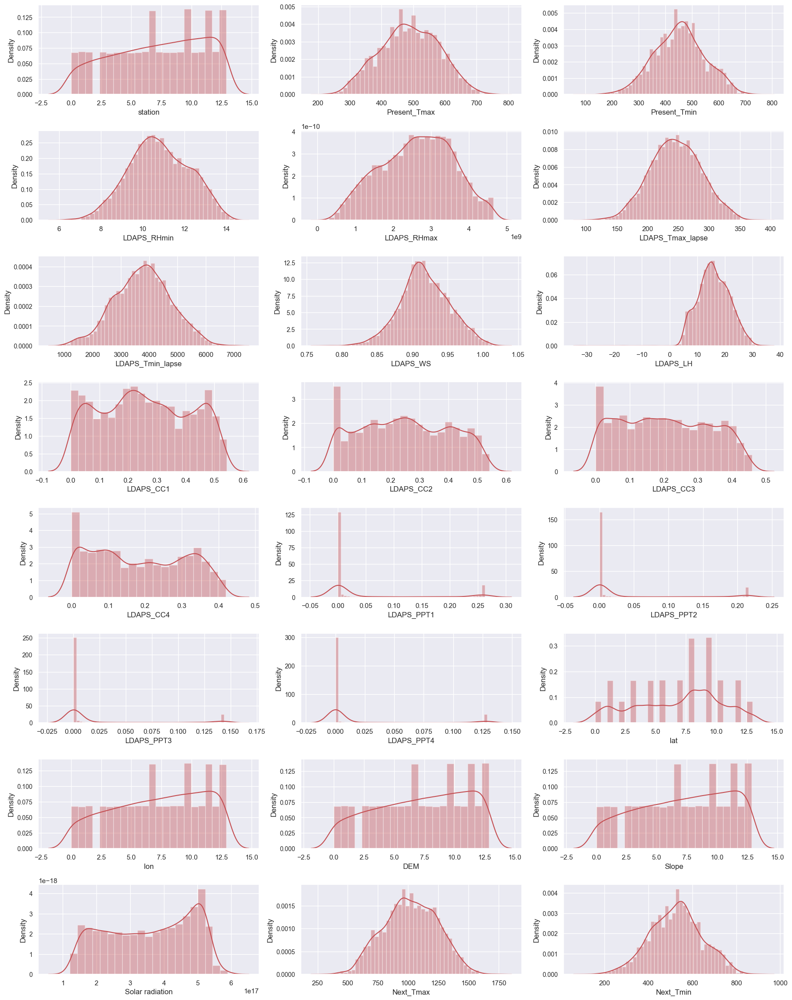

In [72]:
plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in df:
    if plotnumber <= 26:
        ax = plt.subplot(9, 3, plotnumber)
        sns.distplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

### Checking for outliers

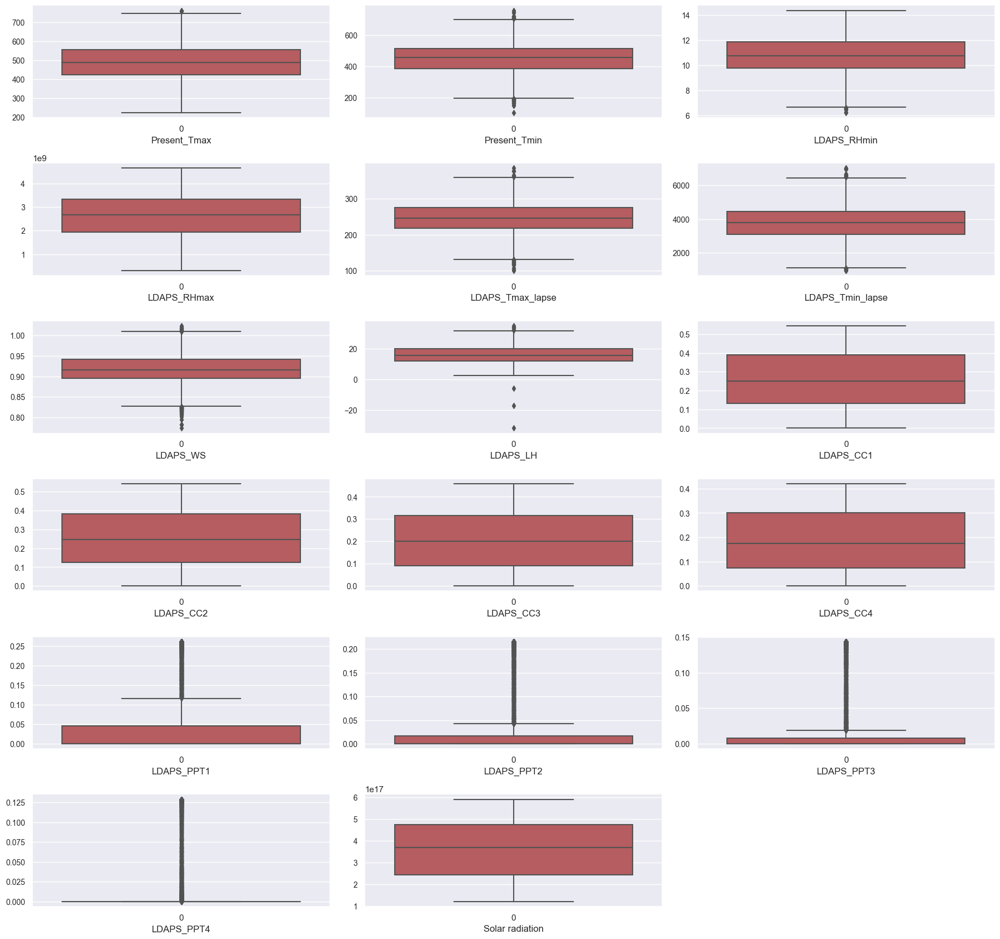

In [73]:
plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 26:
        ax = plt.subplot(9, 3, plotnumber)
        sns.boxplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()


-There a large no. of outliers especially in the precipitation data. Latent heat flux, wind speed, temperature applied lapse rate and Rhmax also have presence of outliers. While there are few in present day tmax and tmin also.

### Removal of Outliers

In [74]:
from scipy.stats import zscore

df= df.apply(zscore)

- We used zscore method to remove outliers from data

In [75]:
df.shape

(7588, 24)

- There is no change of shape after applying zscore method

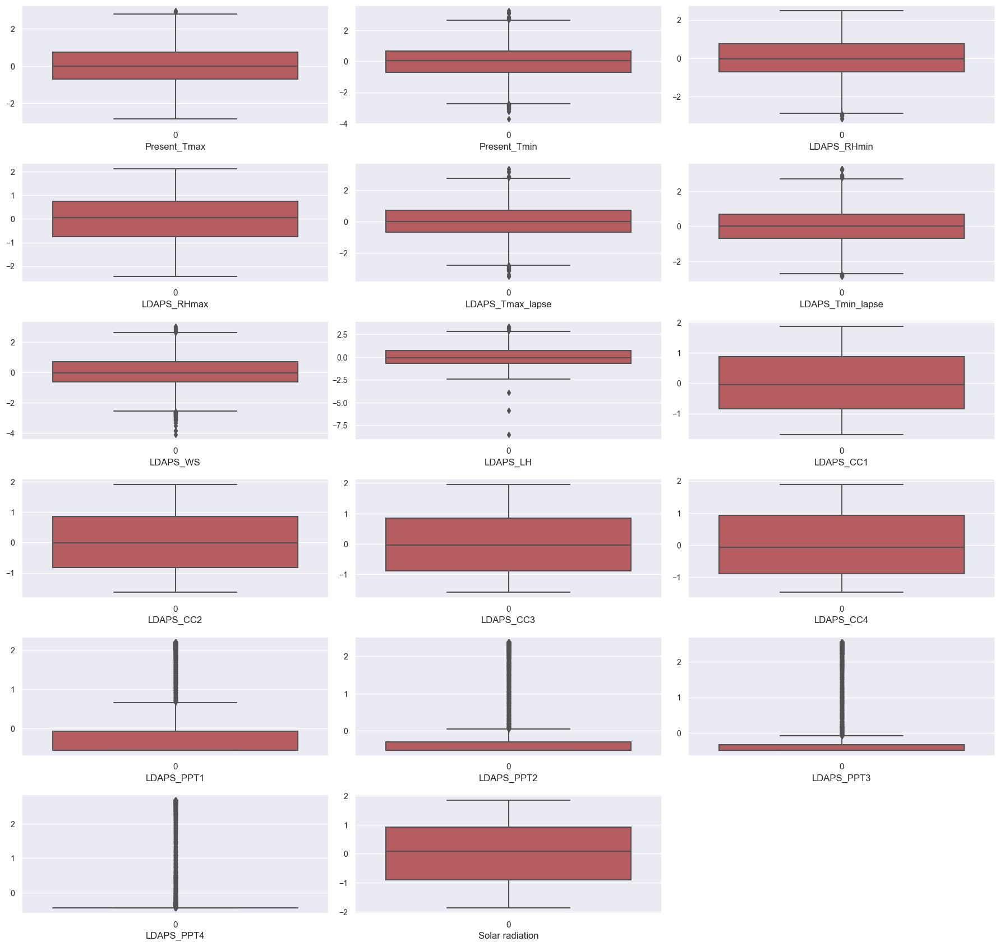

In [76]:
plt.figure(figsize=(18, 25), facecolor='white')
plotnumber = 1

for col in numerical_cols:
    if plotnumber <= 26:
        ax = plt.subplot(9, 3, plotnumber)
        sns.boxplot(df[col], color='r')
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber += 1

plt.tight_layout()
plt.show()

- We still have outliers but moving forward for further analysis

### Checking for Correlation between  variables

In [77]:
#  Checking Correlation
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.118013,0.136566,-0.069341,-0.179141,0.071179,0.111163,0.010021,-0.131453,0.009364,...,-0.009133,-0.015379,-0.006560,-0.223941,-0.149611,-0.296976,-0.098464,-0.026897,0.112823,0.132101
Present_Tmax,0.118013,1.000000,0.621549,-0.194998,-0.334369,0.575804,0.638335,-0.100164,0.126679,-0.308625,...,-0.156269,-0.104666,-0.106800,-0.044706,0.007379,-0.127328,-0.102625,-0.073911,0.617747,0.629770
Present_Tmin,0.136566,0.621549,1.000000,0.125964,-0.044694,0.465954,0.768432,-0.003985,-0.009304,0.089540,...,0.062259,-0.007864,-0.097932,-0.063855,-0.046986,-0.232703,-0.176989,-0.030302,0.469820,0.793851
LDAPS_RHmin,-0.069341,-0.194998,0.125964,1.000000,0.592444,-0.558213,0.083307,0.211802,-0.024414,0.605653,...,0.554784,0.434471,0.297537,0.062338,-0.074171,0.059238,0.054943,0.223533,-0.425137,0.096531
LDAPS_RHmax,-0.179141,-0.334369,-0.044694,0.592444,1.000000,-0.408883,-0.174845,0.113579,0.243476,0.448784,...,0.402320,0.263510,0.179523,0.194283,0.026799,0.176904,0.174709,0.160506,-0.322579,-0.110139
LDAPS_Tmax_lapse,0.071179,0.575804,0.465954,-0.558213,-0.408883,1.000000,0.652100,-0.223690,0.015902,-0.430123,...,-0.405444,-0.328824,-0.267750,-0.024313,0.089911,-0.117153,-0.092995,-0.013515,0.833459,0.589014
LDAPS_Tmin_lapse,0.111163,0.638335,0.768432,0.083307,-0.174845,0.652100,1.000000,-0.059088,-0.143538,0.022141,...,-0.025423,-0.083119,-0.148146,-0.076507,-0.030317,-0.183914,-0.156611,0.041457,0.595746,0.882264
LDAPS_WS,0.010021,-0.100164,-0.003985,0.211802,0.113579,-0.223690,-0.059088,1.000000,-0.025201,0.228516,...,0.233627,0.154581,0.235523,0.001959,-0.078822,0.104162,0.116790,0.169006,-0.266123,-0.036505
LDAPS_LH,-0.131453,0.126679,-0.009304,-0.024414,0.243476,0.015902,-0.143538,-0.025201,1.000000,-0.131919,...,-0.086791,0.002703,0.041758,0.073227,0.031202,0.062217,-0.014734,-0.048146,0.143389,-0.057696
LDAPS_CC1,0.009364,-0.308625,0.089540,0.605653,0.448784,-0.430123,0.022141,0.228516,-0.131919,1.000000,...,0.570042,0.326203,0.247692,-0.012477,-0.010746,-0.019272,-0.022693,0.204101,-0.437142,0.004758


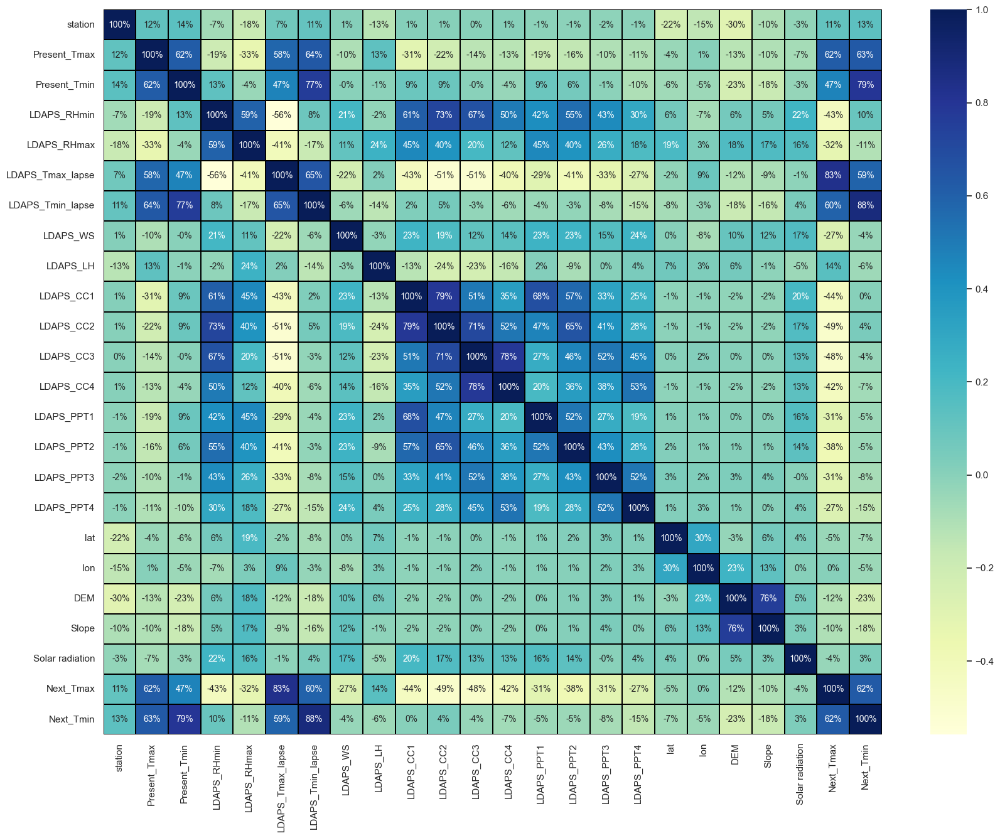

In [78]:
plt.figure(figsize = (20,15))
sns.heatmap(df.corr(), linewidths=0.1, fmt = '0.0%', linecolor ='black', annot = True, cmap = 'YlGnBu',annot_kws={'size' : 10})
plt.yticks(rotation=0)
plt.show()

Positive Correlations: Features with positive correlation coefficients, such as Present_Tmax and Present_Tmin, Present_Tmax and Next_Tmax, Present_Tmin and Next_Tmin, indicate a tendency for the variables to increase or decrease together.

Negative Correlations: Negative correlation coefficients, like the one between LDAPS_RHmin and LDAPS_Tmax_lapse, suggest an inverse relationship where one variable tends to increase as the other decreases.


In [79]:
data = df.copy()

- create a new dataframe by name data

### Working with target variab le Next_Tmax (The next-day maximum air temperature)

In [80]:
df.corr()['Next_Tmax'].sort_values(ascending = False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.833459
Next_Tmin           0.624100
Present_Tmax        0.617747
LDAPS_Tmin_lapse    0.595746
Present_Tmin        0.469820
LDAPS_LH            0.143389
station             0.112823
lon                 0.001932
Solar radiation    -0.038245
lat                -0.046534
Slope              -0.097093
DEM                -0.117456
LDAPS_WS           -0.266123
LDAPS_PPT4         -0.270848
LDAPS_PPT1         -0.305002
LDAPS_PPT3         -0.308124
LDAPS_RHmax        -0.322579
LDAPS_PPT2         -0.376491
LDAPS_CC4          -0.424459
LDAPS_RHmin        -0.425137
LDAPS_CC1          -0.437142
LDAPS_CC3          -0.484493
LDAPS_CC2          -0.487292
Name: Next_Tmax, dtype: float64

- These correlation coefficients provide insights into the linear relationships between 'Next_Tmax' and other variables in the dataset

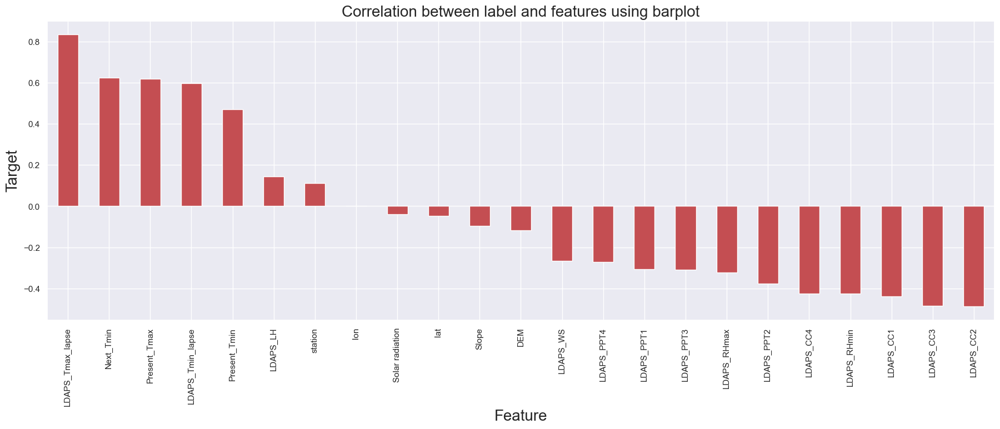

In [81]:
plt.figure(figsize = (22,7))
df.corr()['Next_Tmax'].sort_values(ascending = False).drop(['Next_Tmax']).plot(kind='bar',color='r')
plt.xlabel('Feature', fontsize = 20)
plt.ylabel('Target',fontsize = 20)
plt.title('Correlation between label and features using barplot',fontsize = 20)
plt.show()

- Strong Positive Correlations: 'Next_Tmax' has a strong positive correlation with LDAPS_Tmax_lapse (0.833459).

- Moderate Positive Correlations: Next_Tmax shows moderate positive correlations with Next_Tmin (0.624100) and Present_Tmax (0.617747).

- Weak Positive Correlations: 'Next_Tmax' has weak positive correlations with LDAPS_Tmin_lapse (0.595746) and Present_Tmin (0.469820).

- Weak Negative Correlations: 'Next_Tmax' exhibits weak negative correlations with various features such as LDAPS_WS, LDAPS_PPT4, LDAPS_PPT1, LDAPS_PPT3, LDAPS_RHmax, LDAPS_PPT2, LDAPS_CC4, LDAPS_RHmin, LDAPS_CC1, LDAPS_CC3, and LDAPS_CC2.

### Separating features from target variable 'Next_Tmax'

In [82]:
x=df.drop(columns=['Next_Tmax'],axis=1)
y=df['Next_Tmax']

- The target variable y is derived from the 'Next_Tmax' column to predict or analyze. 

### Standardization of the data

In [83]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin
0,-1.907305,-0.400143,-0.785894,0.176401,0.271501,-0.556608,-0.311364,0.097802,0.318528,-0.407380,...,-0.560421,-0.521172,-0.4944,-0.447011,1.021597,-0.046478,1.521751,1.298265,1.852498,-0.736665
1,-1.667811,0.709652,-0.708063,-0.237180,0.184890,0.041543,0.143619,-0.619344,-0.201095,-0.446317,...,-0.560421,-0.521172,-0.4944,-0.447011,1.021597,0.596281,-0.046056,-0.323714,1.398583,-0.231427
2,-1.460421,0.600750,-0.014024,-0.496590,-0.769141,0.124659,0.392812,-0.309297,-1.380242,-0.522163,...,-0.560421,-0.521172,-0.4944,-0.447011,0.673446,0.956630,-0.322371,-0.929100,1.378325,0.352210
3,-1.271467,0.746176,0.028619,0.175337,1.309753,-0.008668,-0.173951,-0.650457,0.213209,-0.488978,...,-0.560421,-0.521172,-0.4944,-0.447011,1.727750,0.346374,0.087276,1.069874,1.355226,0.526566
4,-1.095136,0.528707,-0.589813,0.035570,0.110434,-0.209847,-0.103645,-0.587672,1.292312,-0.808553,...,-0.560421,-0.521172,-0.4944,-0.447011,0.329011,1.526149,-0.182484,-0.467563,1.364282,-0.231427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.069301,-2.067275,-2.051124,-2.612830,-1.375942,-0.642292,-1.960554,-0.023579,-1.969347,-1.355217,...,-0.560421,-0.521172,-0.4944,-0.447011,0.329011,0.718193,-0.927541,-0.183771,-1.734456,-1.924786
7584,1.184232,-2.225156,-2.175999,-2.060276,-0.803558,-0.998728,-2.094605,-0.563635,0.660500,-1.274975,...,-0.560421,-0.521172,-0.4944,-0.447011,-0.677178,1.302458,-1.094710,-1.670621,-1.751541,-2.103743
7585,1.297744,-2.013757,-2.267619,-2.395860,-1.319444,-1.109970,-1.824694,-0.302325,0.390795,-1.494541,...,-0.560421,-0.521172,-0.4944,-0.447011,-0.011288,-1.462863,-1.668873,-1.273066,-1.749736,-1.801509
7586,1.409915,-2.013757,-2.082634,-2.683428,-1.462026,-0.901582,-1.837066,-0.058794,-0.352678,-1.458474,...,-0.560421,-0.521172,-0.4944,-0.447011,-0.346919,-1.273465,-1.460836,-1.096321,-1.755630,-1.578076


### Checking for Multicollinearity

In [84]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.272787,station
1,2.924907,Present_Tmax
2,3.453933,Present_Tmin
3,6.153551,LDAPS_RHmin
4,2.582002,LDAPS_RHmax
5,7.241489,LDAPS_Tmax_lapse
6,8.728198,LDAPS_Tmin_lapse
7,1.258840,LDAPS_WS
8,1.521977,LDAPS_LH
9,4.694145,LDAPS_CC1


- High VIF is seen for LDAPS_Tmax_lapse, LDAPS_Tmin_lapse

In [85]:
x.drop(columns = ['LDAPS_Tmin_lapse'],axis = 1, inplace=True)

- To avoid overlapping while predicting the target variable, lets drop the column LDAPS_Tmin_lapse

### Rechecking the Multicollinearity issue

In [86]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.272244,station
1,2.768327,Present_Tmax
2,3.375930,Present_Tmin
3,4.957264,LDAPS_RHmin
4,2.511021,LDAPS_RHmax
5,4.726835,LDAPS_Tmax_lapse
6,1.257568,LDAPS_WS
7,1.436806,LDAPS_LH
8,4.581441,LDAPS_CC1
9,5.583785,LDAPS_CC2


In [88]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.tree import  DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.svm import SVR 
from sklearn.linear_model import LinearRegression,Lasso,Ridge,SGDRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

In [89]:
maxAccu = 0
maxRs = 0                       
for i in range(1,200):
    x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.20, random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print('Maximum r2score is ', maxAccu, 'on random_state', maxRS)

Maximum r2score is  0.8177183873393081 on random_state 30


In [90]:
x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.20, random_state=maxRS)

In [91]:
# Checking accuracy for LinearRegression
LR = LinearRegression()
LR.fit(x_train,y_train)
pred_LR = LR.predict(x_test)
pred_train = LR.predict(x_train)
print('R2_score on training data::',r2_score(y_train,pred_train)*100)
print('R2_score on testing data:',r2_score(y_test,pred_LR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_LR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_LR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_LR)))

R2_score on training data:: 78.8631769829463
R2_score on testing data: 0.8177183873393081
Mean Absolute Error: 0.3327942799983197
Mean Squared Error: 0.18401752469435437
Root Mean Squared Error: 0.4289726386313635


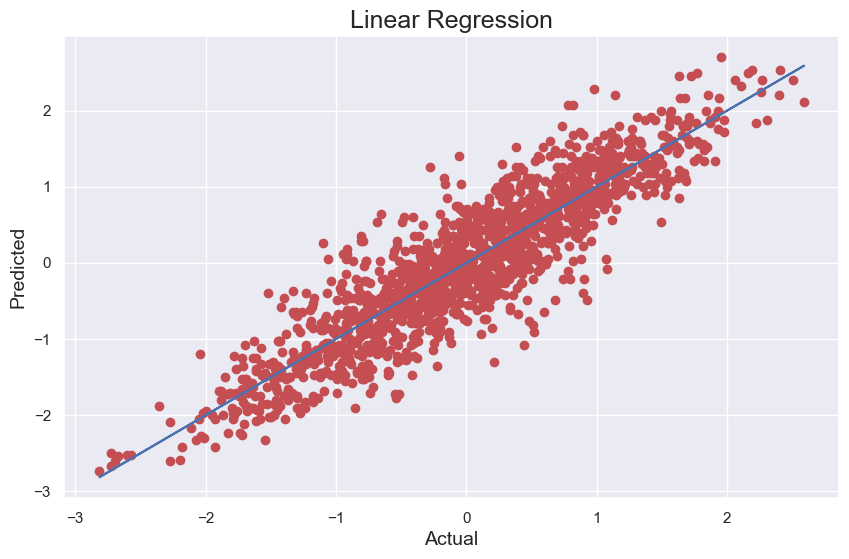

In [92]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_LR, y=y_test, color = 'r')
plt.plot(pred_LR,pred_LR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Linear Regression', fontsize = 18)
plt.show()

In [93]:
RFR = RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR = RFR.predict(x_test)
pred_train = RFR.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_RFR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_RFR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_RFR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_RFR)))

R2_score on training data: 98.63894560146666
R2_score on test data: 0.9140541339468352
Mean Absolute Error: 0.22048051847181876
Mean Squared Error: 0.0867643493930228
Root Mean Squared Error: 0.2945578880169784


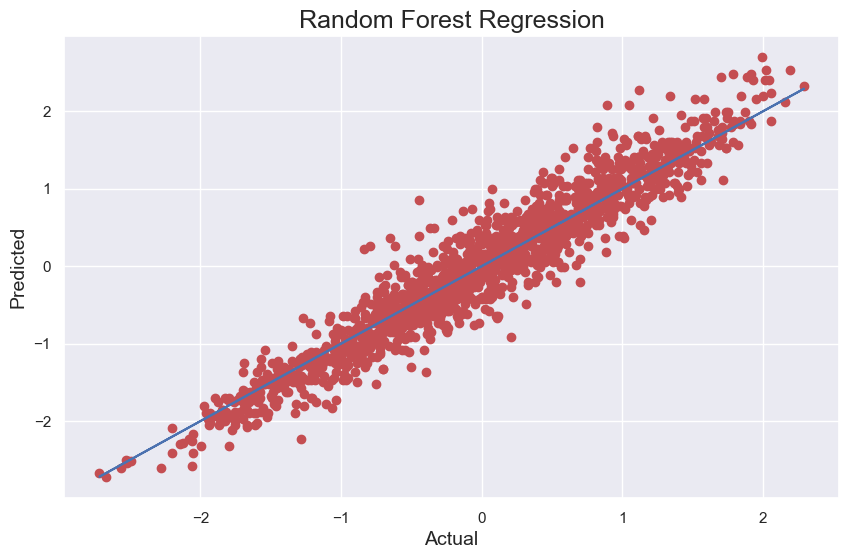

In [94]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_RFR, y=y_test, color = 'r')
plt.plot(pred_RFR,pred_RFR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Random Forest Regression', fontsize = 18)
plt.show()

In [95]:
knn= KNN()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)
pred_train = knn.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_knn))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error:',mean_squared_error(y_test,pred_knn))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_knn)))

R2_score on training data: 89.53908016851307
R2_score on test data: 0.854880852414206
Mean Absolute Error: 0.29516375416108864
Mean Squared Error: 0.14650115244592193
Root Mean Squared Error: 0.3827546896458905


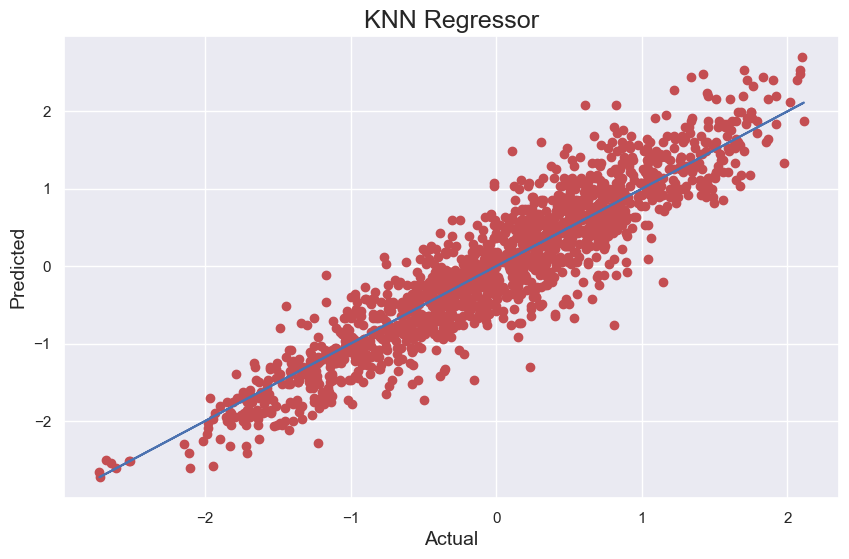

In [96]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_knn, y=y_test, color = 'r')
plt.plot(pred_knn,pred_knn,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('KNN Regressor', fontsize = 18)
plt.show()

In [97]:
GBR= GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR = GBR.predict(x_test)
pred_train = GBR.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_GBR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_GBR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_GBR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_GBR)))

R2_score on training data: 87.35641605622507
R2_score on test data: 0.870062439254582
Mean Absolute Error: 0.2843240618472616
Mean Squared Error: 0.13117498766978133
Root Mean Squared Error: 0.362180877007306


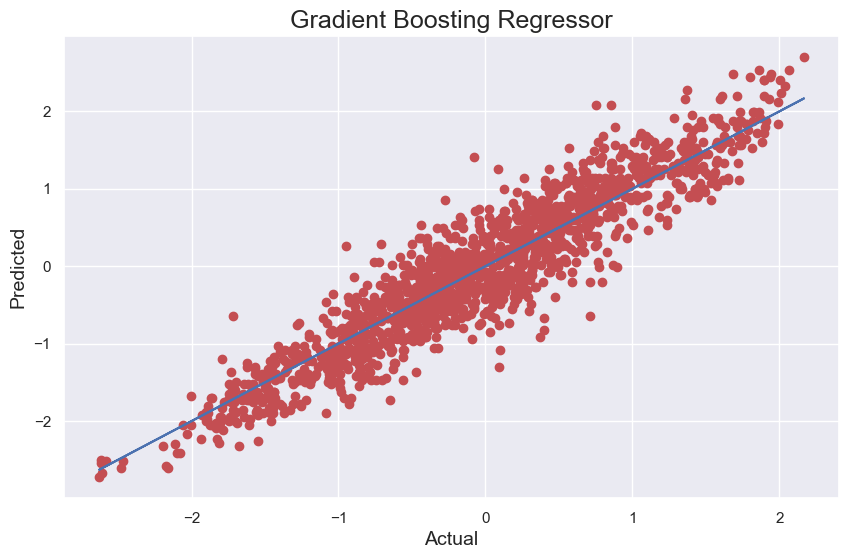

In [98]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_GBR, y=y_test, color = 'r')
plt.plot(pred_GBR,pred_GBR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Gradient Boosting Regressor', fontsize = 18)
plt.show()

In [99]:
svr = SVR()
svr.fit(x_train,y_train)
pred_svr = svr.predict(x_test)
pred_train = svr.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_svr))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_svr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_svr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_svr)))

R2_score on training data: 93.67176459714801
R2_score on test data: 0.9171249943160202
Mean Absolute Error: 0.21802354876127794
Mean Squared Error: 0.08366424447530241
Root Mean Squared Error: 0.2892477216423708


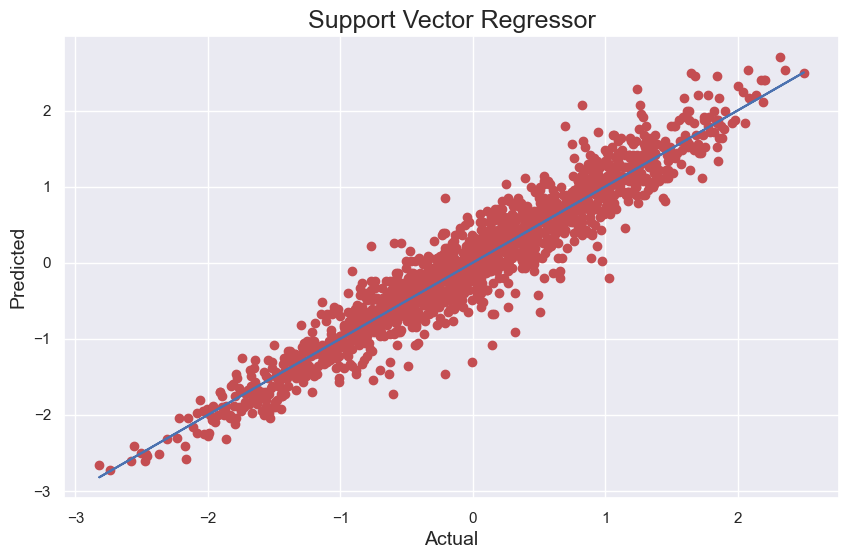

In [100]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_svr, y=y_test, color = 'r')
plt.plot(pred_svr,pred_svr,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Support Vector Regressor', fontsize = 18)
plt.show()

In [101]:
ETR = ExtraTreesRegressor()
ETR.fit(x_train,y_train)
pred_ETR = ETR.predict(x_test)
pred_train = ETR.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_ETR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_ETR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_ETR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_ETR)))

R2_score on training data: 100.0
R2_score on test data: 0.9307966916585756
Mean Absolute Error: 0.19982847476289012
Mean Squared Error: 0.06986234824109187
Root Mean Squared Error: 0.26431486572096524


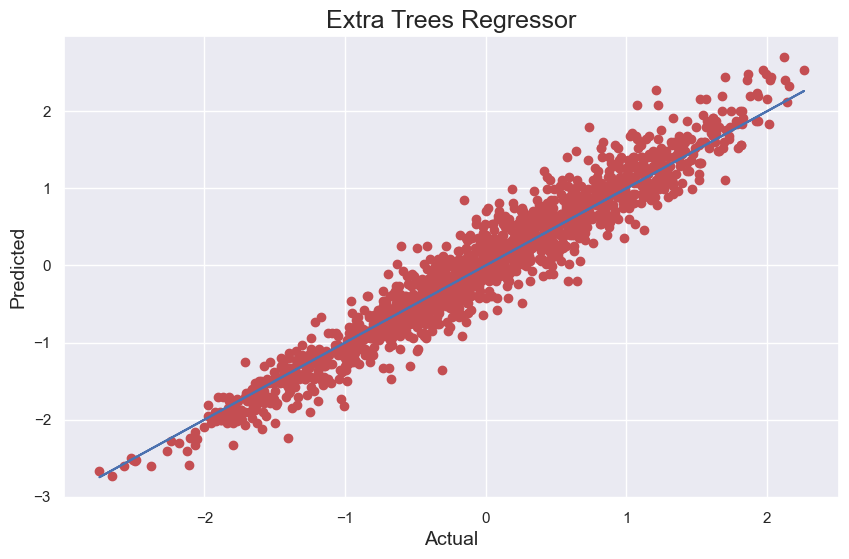

In [102]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_ETR, y=y_test, color = 'r')
plt.plot(pred_ETR,pred_ETR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Extra Trees Regressor', fontsize = 18)
plt.show()

### Cross Validation Score

In [103]:
from sklearn.model_selection import cross_val_score

### Random Forest Regressor

In [104]:
score1 = cross_val_score(RFR,x,y)
print(score1)
print('RFR score:',score1.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_RFR)-score1.mean())*100)

[0.71631963 0.67216813 0.67333878 0.81091047 0.69145722]
RFR score: 0.7128388467678255
Difference between R2 score and cross validation is:  20.121528717900972


### KNeighborsRegressor

In [105]:
score2 = cross_val_score(knn,x,y)
print(score2)
print('KNN score:',score2.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_knn)-score2.mean())*100)

[0.63705037 0.45917775 0.45133228 0.7225066  0.63591769]
KNN score: 0.5811969383077502
Difference between R2 score and cross validation is:  27.368391410645575


### GradientBoosingRegressor

In [106]:
score3 = cross_val_score(GBR,x,y)
print(score3)
print('GBR score:',score3.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_GBR)-score3.mean())*100)

[0.71970582 0.68667019 0.6865001  0.8436238  0.71008538]
GBR score: 0.7293170577711635
Difference between R2 score and cross validation is:  14.074538148341853


### SupportVectorRegressor

In [107]:
score4 = cross_val_score(svr,x,y)
print(score4)
print('SVR score:',score4.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_svr)-score4.mean())*100)

[0.68747752 0.6044173  0.67173376 0.83208007 0.72207039]
SVR score: 0.7035558097631702
Difference between R2 score and cross validation is:  21.356918455285


### ExtraTreesRegressor

In [108]:
score5 = cross_val_score(ETR,x,y)
print(score5)
print('ETR score:',score5.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_svr)-score5.mean())*100)

[0.70728656 0.6429395  0.67589998 0.81892425 0.70503202]
ETR score: 0.7100164618772804
Difference between R2 score and cross validation is:  20.710853243873984


### LinearRegression

In [109]:
score6 = cross_val_score(LR,x,y)
print(score6)
print('LR score:',score6.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_LR)-score6.mean())*100)

[0.7223664  0.67003934 0.69276889 0.83517944 0.73666906]
LR score: 0.7314046273612422
Difference between R2 score and cross validation is:  8.63137599780659


### Compare accuracy of models

In [110]:
pd.DataFrame([['Support Vector Regressor',score4.mean()*100],['Extra Trees Regressor',score5.mean()*100],
              ['Gradient Boosting Regressor',score3.mean()*100],['Random Forest Regressor',score1.mean()*100],
              ['KNeighborsClassifier',score2.mean()*100],
              ['Linear Regression',score6.mean()*100]],columns=['Models','Accuracy'])

,Models,Accuracy
0,Support Vector Regressor,70.355581
1,Extra Trees Regressor,71.001646
2,Gradient Boosting Regressor,72.931706
3,Random Forest Regressor,71.283885
4,KNeighborsClassifier,58.119694
5,Linear Regression,73.140463


### Hyperparameter Tuning 

In [111]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge, Lasso, RidgeCV,LassoCV

In [112]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

### Lasso and Ridge Regularization

In [113]:
# Define the models
lasso_model = Lasso()
ridge_model = Ridge()

In [114]:
param_grid = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}

lasso_grid = GridSearchCV(lasso_model, param_grid, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 100]},
             scoring='neg_mean_squared_error')

In [115]:
ridge_grid = GridSearchCV(ridge_model, param_grid, cv=5, scoring='neg_mean_squared_error')
ridge_grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 100]},
             scoring='neg_mean_squared_error')

In [116]:
print("Best hyperparameters for Lasso:", lasso_grid.best_params_)
print("Best hyperparameters for Ridge:", ridge_grid.best_params_)

Best hyperparameters for Lasso: {'alpha': 0.001}
Best hyperparameters for Ridge: {'alpha': 10}


In [117]:
lasso_preds = lasso_grid.predict(x_test)
ridge_preds = ridge_grid.predict(x_test)

In [121]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

lasso_r2 = r2_score(y_test, lasso_preds)
ridge_r2 = r2_score(y_test, ridge_preds)

lasso_mse = mean_squared_error(y_test, lasso_preds)
ridge_mse = mean_squared_error(y_test, ridge_preds)

lasso_mae = mean_absolute_error(y_test, lasso_preds)
ridge_mae = mean_absolute_error(y_test, ridge_preds)


In [122]:
print("Lasso R2 Score:", lasso_r2)
print("Ridge R2 Score:", ridge_r2)
print("\nLasso Mean Squared Error:", lasso_mse)
print("Ridge Mean Squared Error:", ridge_mse)
print("\nLasso Mean Absolute Error:", lasso_mae)
print("Ridge Mean Absolute Error:", ridge_mae)


Lasso R2 Score: 0.7773652178994565
Ridge R2 Score: 0.7779358150357136

Lasso Mean Squared Error: 0.21918287394793412
Ridge Mean Squared Error: 0.2186211238071371

Lasso Mean Absolute Error: 0.35791776252166285
Ridge Mean Absolute Error: 0.35757378434214615


**The model selected is GradientBoostingRegressor:**

- cross_val_score is 72.93
- Difference between R2 score and cross validation is: 14.074
- R2_score on training data: 87.35
- R2_score on test data: 87.0
- Mean Absolute Error: 0.284
- Mean Squared Error: 0.13
- Root Mean Squared Error: 0.36

### GradientBoostingRegressor

In [123]:
grid_param = {'max_depth': range(4,8),           
              'min_samples_split':range(2,8,2),
              'learning_rate': np.arange(0.1,0.3)}

grid = GridSearchCV(GradientBoostingRegressor(),param_grid=grid_param)
grid.fit(x_train,y_train) 

GridSearchCV(estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': array([0.1]),
                         'max_depth': range(4, 8),
                         'min_samples_split': range(2, 8, 2)})

In [124]:
grid.best_params_

{'learning_rate': 0.1, 'max_depth': 7, 'min_samples_split': 2}

In [125]:
Model = GradientBoostingRegressor(learning_rate= 0.1, max_depth= 7, min_samples_split= 2,ccp_alpha=0.0, criterion='friedman_mse',
                                  max_features=None,max_leaf_nodes=8,min_impurity_decrease=0.0,min_samples_leaf=1,
                                  min_weight_fraction_leaf=0.0,random_state=129)

In [126]:
Model.fit(x_train,y_train)
pred = Model.predict(x_test)

print('R2_score:',r2_score(y_test,pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))

R2_score: 0.8632791738646381
Mean Absolute Error: 0.28388058539868966
Mean Squared Error: 0.13460099683503712
Root Mean Squared Error: 0.3668800850891707


In [127]:
import pickle
filename = 'Next_Tmax_prediction.pkl'
pickle.dump(Model,open(filename,'wb')) 

In [128]:
import pickle
loaded_model = pickle.load(open('Next_Tmax_prediction.pkl','rb'))
result = loaded_model.score(x_test,y_test)
print(result*100)

86.32791738646381


In [129]:
conclusion = pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['Predicted','Original'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1508,1509,1510,1511,1512,1513,1514,1515,1516,1517
Predicted,-0.583749,-1.339010,1.087701,-0.761736,-0.558213,0.705119,-2.557980,-0.079859,-1.540956,-1.251302,...,-0.986657,1.379864,0.236228,0.239215,-1.808316,0.911342,1.047302,0.101335,-1.815055,-1.020778
Original,-0.550991,-0.821875,1.108389,-1.467384,-0.333110,1.257835,-2.519289,-0.237796,-1.752648,-1.624847,...,-0.550991,1.333360,0.531887,-0.396006,-1.752648,0.708399,1.524520,-0.141316,-2.323313,-1.359909


### Separating features from target variable 'Next_Tmin'

In [130]:
data.head(2)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,-1.907305,-0.400143,-0.785894,0.176401,0.271501,-0.556608,-0.311364,0.097802,0.318528,-0.407380,...,-0.521172,-0.4944,-0.447011,1.021597,-0.046478,1.521751,1.298265,1.852498,-0.427261,-0.736665
1,-1.667811,0.709652,-0.708063,-0.237180,0.184890,0.041543,0.143619,-0.619344,-0.201095,-0.446317,...,-0.521172,-0.4944,-0.447011,1.021597,0.596281,-0.046056,-0.323714,1.398583,0.022083,-0.231427


In [131]:
data.corr()['Next_Tmin'].sort_values(ascending = False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.882264
Present_Tmin        0.793851
Present_Tmax        0.629770
Next_Tmax           0.624100
LDAPS_Tmax_lapse    0.589014
station             0.132101
LDAPS_RHmin         0.096531
LDAPS_CC2           0.041976
Solar radiation     0.027986
LDAPS_CC1           0.004758
LDAPS_WS           -0.036505
LDAPS_CC3          -0.036785
lon                -0.047665
LDAPS_PPT2         -0.047989
LDAPS_PPT1         -0.052023
LDAPS_LH           -0.057696
lat                -0.067553
LDAPS_CC4          -0.067843
LDAPS_PPT3         -0.081301
LDAPS_RHmax        -0.110139
LDAPS_PPT4         -0.152262
Slope              -0.179192
DEM                -0.231695
Name: Next_Tmin, dtype: float64

- The data showcases various correlations between Next_Tmin and different variables, highlighting both positive and negative associations.

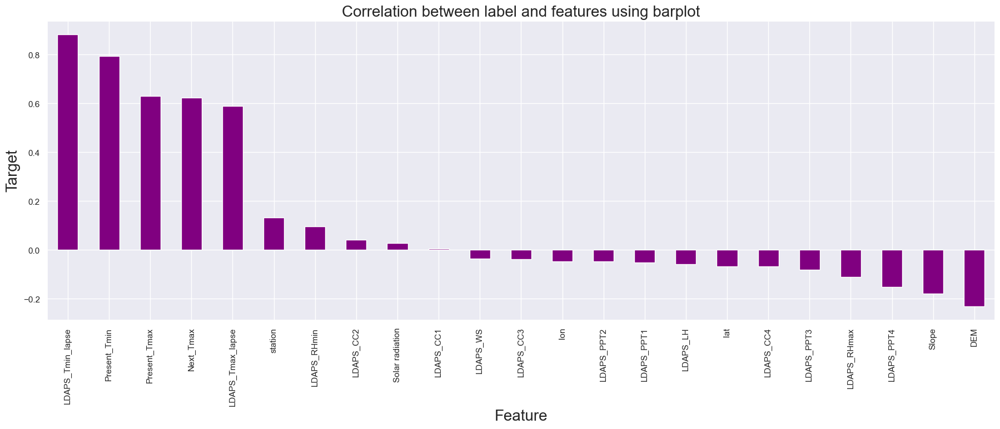

In [132]:
plt.figure(figsize = (22,7))
data.corr()['Next_Tmin'].sort_values(ascending = False).drop(['Next_Tmin']).plot(kind='bar',color='purple')
plt.xlabel('Feature', fontsize = 20)
plt.ylabel('Target',fontsize = 20)
plt.title('Correlation between label and features using barplot',fontsize = 20)
plt.show()

- The strongest positive correlation with Next_Tmin is observed with LDAPS_Tmin_lapse (0.882264), followed by Present_Tmin (0.793851) and Present_Tmax (0.629770).
- Notably, LDAPS_Tmax_lapse (0.589014) and Next_Tmax (0.624100) also show positive correlations, albeit slightly weaker.
- Negative correlations are seen with geographical factors such as Slope (-0.179192) and DEM (-0.231695), indicating a tendency for lower temperatures in areas with higher slopes and elevations.

### Separating features from target variable

In [133]:
x=data.drop(columns=['Next_Tmin'],axis=1)
y=data['Next_Tmin']

- Analyze the dataset by separating predictors (x) and the target variable (y)where we need to predict  Next_Tmin temperature.

### Standardization of the data

In [134]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,-1.907305,-0.400143,-0.785894,0.176401,0.271501,-0.556608,-0.311364,0.097802,0.318528,-0.407380,...,-0.560421,-0.521172,-0.4944,-0.447011,1.021597,-0.046478,1.521751,1.298265,1.852498,-0.427261
1,-1.667811,0.709652,-0.708063,-0.237180,0.184890,0.041543,0.143619,-0.619344,-0.201095,-0.446317,...,-0.560421,-0.521172,-0.4944,-0.447011,1.021597,0.596281,-0.046056,-0.323714,1.398583,0.022083
2,-1.460421,0.600750,-0.014024,-0.496590,-0.769141,0.124659,0.392812,-0.309297,-1.380242,-0.522163,...,-0.560421,-0.521172,-0.4944,-0.447011,0.673446,0.956630,-0.322371,-0.929100,1.378325,0.222466
3,-1.271467,0.746176,0.028619,0.175337,1.309753,-0.008668,-0.173951,-0.650457,0.213209,-0.488978,...,-0.560421,-0.521172,-0.4944,-0.447011,1.727750,0.346374,0.087276,1.069874,1.355226,0.427564
4,-1.095136,0.528707,-0.589813,0.035570,0.110434,-0.209847,-0.103645,-0.587672,1.292312,-0.808553,...,-0.560421,-0.521172,-0.4944,-0.447011,0.329011,1.526149,-0.182484,-0.467563,1.364282,0.256321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.069301,-2.067275,-2.051124,-2.612830,-1.375942,-0.642292,-1.960554,-0.023579,-1.969347,-1.355217,...,-0.560421,-0.521172,-0.4944,-0.447011,0.329011,0.718193,-0.927541,-0.183771,-1.734456,-0.880665
7584,1.184232,-2.225156,-2.175999,-2.060276,-0.803558,-0.998728,-2.094605,-0.563635,0.660500,-1.274975,...,-0.560421,-0.521172,-0.4944,-0.447011,-0.677178,1.302458,-1.094710,-1.670621,-1.751541,-0.762574
7585,1.297744,-2.013757,-2.267619,-2.395860,-1.319444,-1.109970,-1.824694,-0.302325,0.390795,-1.494541,...,-0.560421,-0.521172,-0.4944,-0.447011,-0.011288,-1.462863,-1.668873,-1.273066,-1.749736,-0.672664
7586,1.409915,-2.013757,-2.082634,-2.683428,-1.462026,-0.901582,-1.837066,-0.058794,-0.352678,-1.458474,...,-0.560421,-0.521172,-0.4944,-0.447011,-0.346919,-1.273465,-1.460836,-1.096321,-1.755630,-0.581601


### Checking for Multicollinearity

In [135]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.287868,station
1,3.000455,Present_Tmax
2,3.125386,Present_Tmin
3,6.153631,LDAPS_RHmin
4,2.562364,LDAPS_RHmax
5,8.844654,LDAPS_Tmax_lapse
6,7.186150,LDAPS_Tmin_lapse
7,1.287454,LDAPS_WS
8,1.549779,LDAPS_LH
9,4.698845,LDAPS_CC1


- The dataset's Variance Inflation Factor (VIF) values indicate potential multicollinearity, with LDAPS_Tmax_lapse, LDAPS_Tmin_lapse, and Next_Tmax exhibiting high VIF scores, suggesting strong correlations among these predictors.

In [136]:
x.drop(columns = ['LDAPS_Tmax_lapse'],axis = 1, inplace=True)

- Lets drop column to remove multicollinearity issue

In [137]:
vif = pd.DataFrame()
vif['vif values'] =[variance_inflation_factor(x.values,i) for i in range (len(x.columns))]
vif['Features'] =x.columns

vif

,vif values,Features
0,1.281048,station
1,2.937122,Present_Tmax
2,3.122332,Present_Tmin
3,4.147133,LDAPS_RHmin
4,2.543557,LDAPS_RHmax
5,4.269111,LDAPS_Tmin_lapse
6,1.280132,LDAPS_WS
7,1.549365,LDAPS_LH
8,4.672466,LDAPS_CC1
9,5.539669,LDAPS_CC2


- The VIF values for the features are within an acceptable range, indicating no multicollinearity issues in the dataset. The stability and interpretability of the model are likely unaffected by high correlations among predictors.

In [138]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.tree import  DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.svm import SVR 
from sklearn.linear_model import LinearRegression,Lasso,Ridge,SGDRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

In [139]:
maxAccu = 0
maxRs = 0                       
for i in range(1,200):
    x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.20, random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print('Maximum r2score is ', maxAccu, 'on random_state', maxRS)

Maximum r2score is  0.8675525848012371 on random_state 103


In [140]:
x_train, x_test,y_train,y_test = train_test_split(x,y,test_size =0.20, random_state=maxRS)

In [141]:
# Checking accuracy for LinearRegression
LR = LinearRegression()
LR.fit(x_train,y_train)
pred_LR = LR.predict(x_test)
pred_train = LR.predict(x_train)
print('R2_score on training data::',r2_score(y_train,pred_train)*100)
print('R2_score on testing data:',r2_score(y_test,pred_LR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_LR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_LR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_LR)))

R2_score on training data:: 84.2104212988594
R2_score on testing data: 0.8675525848012371
Mean Absolute Error: 0.29343199301543704
Mean Squared Error: 0.13597654696577924
Root Mean Squared Error: 0.36874997893664924


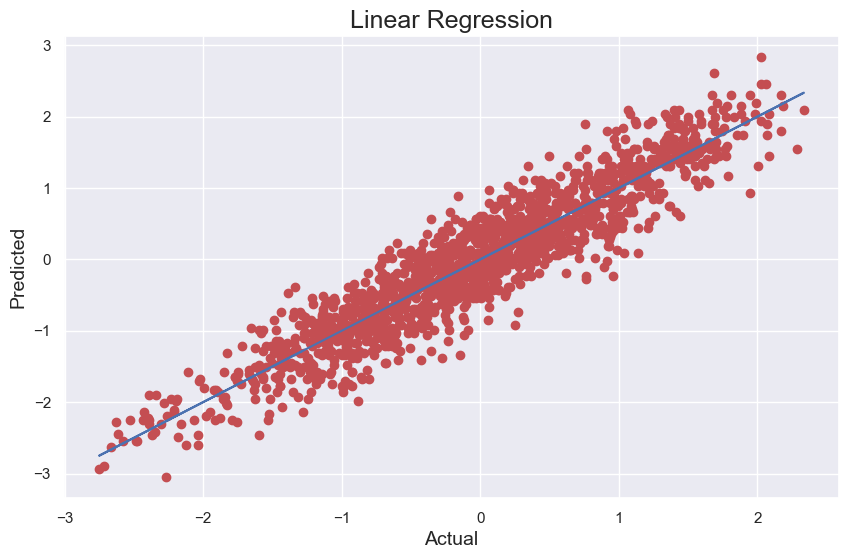

In [142]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_LR, y=y_test, color = 'r')
plt.plot(pred_LR,pred_LR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Linear Regression', fontsize = 18)
plt.show()

In [143]:
RFR = RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR = RFR.predict(x_test)
pred_train = RFR.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_RFR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_RFR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_RFR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_RFR)))

R2_score on training data: 98.7134181687743
R2_score on test data: 0.9229009972023335
Mean Absolute Error: 0.21660606740237404
Mean Squared Error: 0.07915334670139759
Root Mean Squared Error: 0.2813420457404076


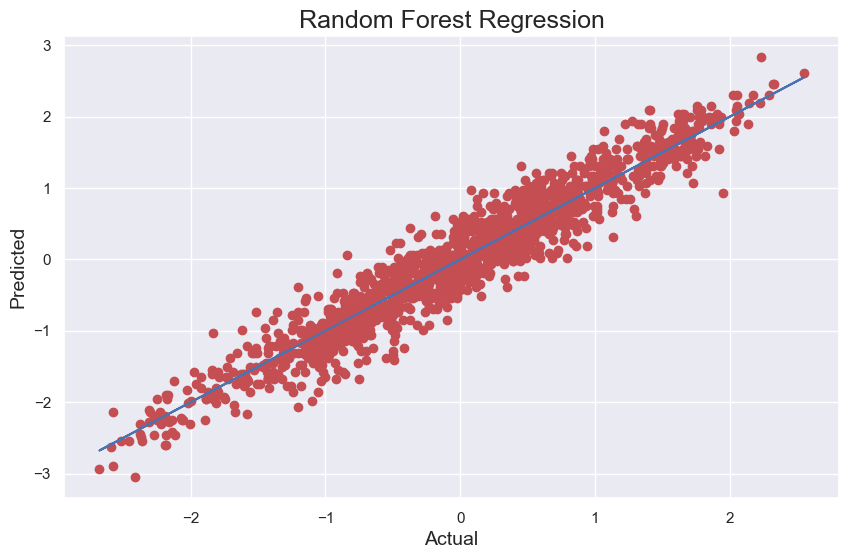

In [144]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_RFR, y=y_test, color = 'r')
plt.plot(pred_RFR,pred_RFR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Random Forest Regression', fontsize = 18)
plt.show()

In [145]:
knn= KNN()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)
pred_train = knn.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_knn))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error:',mean_squared_error(y_test,pred_knn))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_knn)))

R2_score on training data: 91.44407385846348
R2_score on test data: 0.8806138043602696
Mean Absolute Error: 0.2768695449403949
Mean Squared Error: 0.12256730427022444
Root Mean Squared Error: 0.35009613575448734


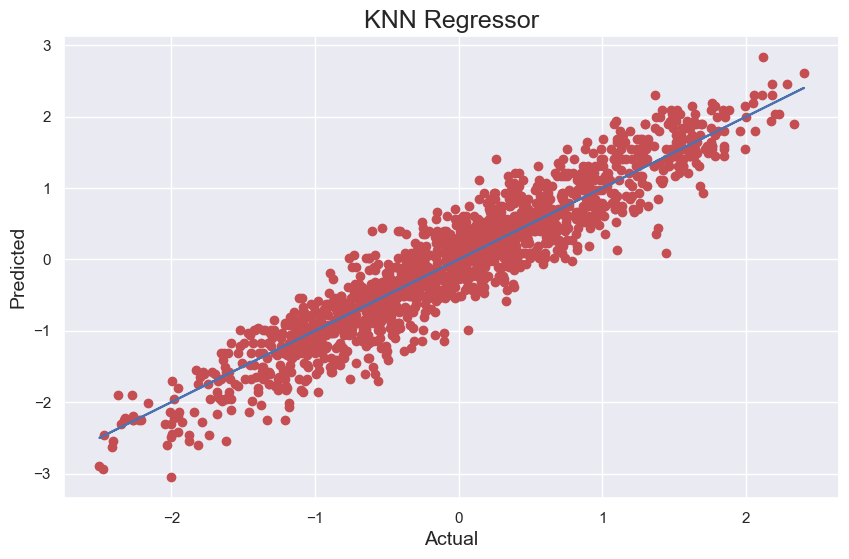

In [146]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_knn, y=y_test, color = 'r')
plt.plot(pred_knn,pred_knn,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('KNN Regressor', fontsize = 18)
plt.show()

In [147]:
GBR= GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR = GBR.predict(x_test)
pred_train = GBR.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_GBR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_GBR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_GBR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_GBR)))

R2_score on training data: 90.87757295528932
R2_score on test data: 0.9110847614539822
Mean Absolute Error: 0.23954420990236763
Mean Squared Error: 0.09128443233099034
Root Mean Squared Error: 0.30213313676422576


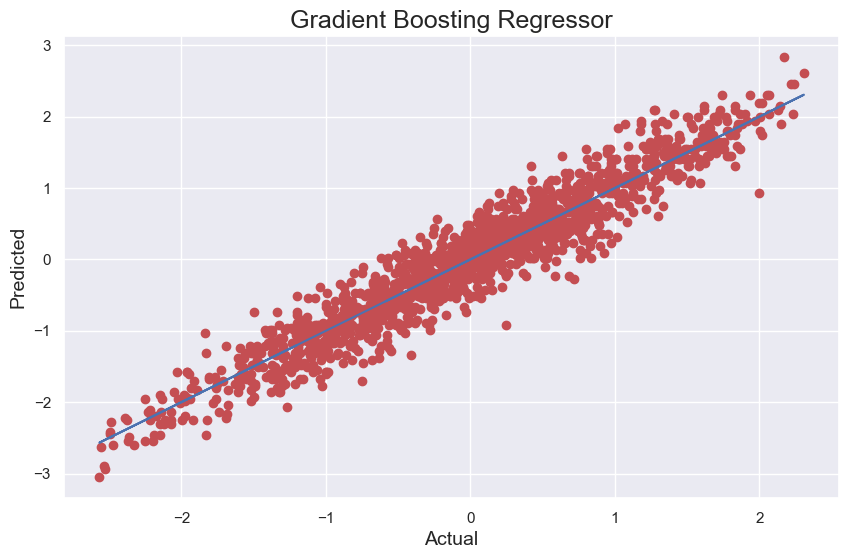

In [148]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_GBR, y=y_test, color = 'r')
plt.plot(pred_GBR,pred_GBR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Gradient Boosting Regressor', fontsize = 18)
plt.show()

In [149]:
svr = SVR()
svr.fit(x_train,y_train)
pred_svr = svr.predict(x_test)
pred_train = svr.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_svr))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_svr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_svr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_svr)))

R2_score on training data: 95.5086703652309
R2_score on test data: 0.9393725840713326
Mean Absolute Error: 0.19365701494832097
Mean Squared Error: 0.06224286564646585
Root Mean Squared Error: 0.249485201257441


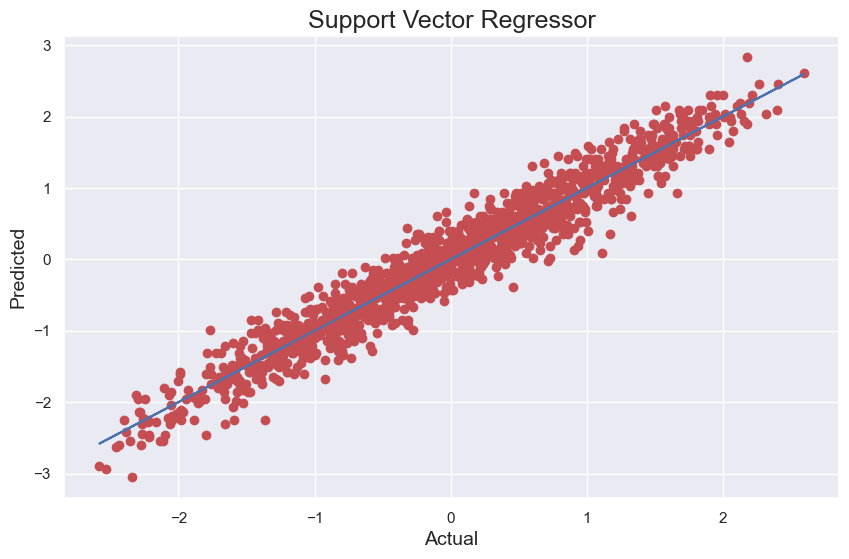

In [150]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_svr, y=y_test, color = 'r')
plt.plot(pred_svr,pred_svr,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Support Vector Regressor', fontsize = 18)
plt.show()

In [151]:
ETR = ExtraTreesRegressor()
ETR.fit(x_train,y_train)
pred_ETR = ETR.predict(x_test)
pred_train = ETR.predict(x_train)
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('R2_score on test data:',r2_score(y_test,pred_ETR))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_ETR))
print('Mean Squared Error:',mean_squared_error(y_test,pred_ETR))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_ETR)))

R2_score on training data: 100.0
R2_score on test data: 0.9306125162174856
Mean Absolute Error: 0.205010343649861
Mean Squared Error: 0.07123635016380785
Root Mean Squared Error: 0.2669013865902683


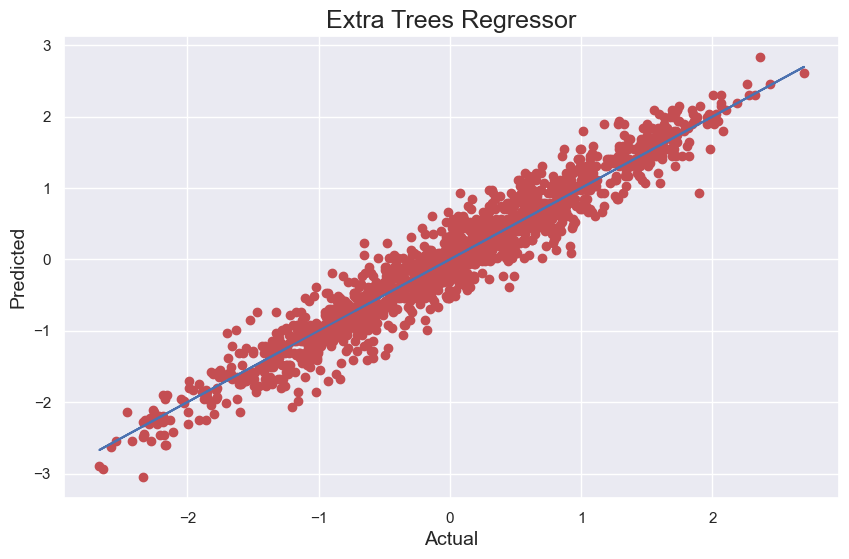

In [152]:
plt.figure(figsize = (10,6))
plt.scatter(x = pred_ETR, y=y_test, color = 'r')
plt.plot(pred_ETR,pred_ETR,color = 'b')
plt.xlabel('Actual', fontsize =14)
plt.ylabel('Predicted', fontsize =14)
plt.title('Extra Trees Regressor', fontsize = 18)
plt.show()

### Cross Validation Score

In [153]:
from sklearn.model_selection import cross_val_score

### Random Forest Regressor

In [154]:
score1 = cross_val_score(RFR,x,y)
print(score1)
print('RFR score:',score1.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_RFR)-score1.mean())*100)

[0.71622942 0.68902736 0.81897646 0.87833402 0.87406482]
RFR score: 0.7953264123998375
Difference between R2 score and cross validation is:  12.757458480249607


### KNeighborsRegressor

In [155]:
score2 = cross_val_score(knn,x,y)
print(score2)
print('KNN score:',score2.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_knn)-score2.mean())*100)

[0.53683619 0.48826215 0.67433159 0.73507552 0.78545393]
KNN score: 0.64399187917767
Difference between R2 score and cross validation is:  23.66219251825996


### GradientBoosingRegressor

In [156]:
score3 = cross_val_score(GBR,x,y)
print(score3)
print('GBR score:',score3.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_GBR)-score3.mean())*100)

[0.72489603 0.69812019 0.83253459 0.88738488 0.8960802 ]
GBR score: 0.8078031780712849
Difference between R2 score and cross validation is:  10.328158338269732


### SupportVectorRegressor

In [157]:
score4 = cross_val_score(svr,x,y)
print(score4)
print('SVR score:',score4.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_svr)-score4.mean())*100)

[0.71561413 0.65921474 0.7949653  0.85495806 0.83312775]
SVR score: 0.7715759967926692
Difference between R2 score and cross validation is:  16.77965872786634


### ExtraTreesRegressor

In [158]:
score5 = cross_val_score(ETR,x,y)
print(score5)
print('ETR score:',score5.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_svr)-score5.mean())*100)

[0.7233607  0.69550556 0.82561548 0.87793684 0.88960816]
ETR score: 0.802405346910587
Difference between R2 score and cross validation is:  13.696723716074565


### LinearRegression

In [159]:
score6 = cross_val_score(LR,x,y)
print(score6)
print('LR score:',score6.mean())
print('Difference between R2 score and cross validation is: ',(r2_score(y_test,pred_LR)-score6.mean())*100)

[0.73991154 0.68135414 0.81060229 0.88044325 0.87322257]
LR score: 0.7971067580091505
Difference between R2 score and cross validation is:  7.044582679208656


### Compare accuracy of models

In [160]:
pd.DataFrame([['Support Vector Regressor',score4.mean()*100],['Extra Trees Regressor',score5.mean()*100],
              ['Gradient Boosting Regressor',score3.mean()*100],['Random Forest Regressor',score1.mean()*100],
              ['KNeighborsClassifier',score2.mean()*100],
              ['Linear Regression',score6.mean()*100]],columns=['Models','Accuracy'])

,Models,Accuracy
0,Support Vector Regressor,77.157600
1,Extra Trees Regressor,80.240535
2,Gradient Boosting Regressor,80.780318
3,Random Forest Regressor,79.532641
4,KNeighborsClassifier,64.399188
5,Linear Regression,79.710676


**The model selected is GradientBoostingRegressor:**

- cross_val_score is 80.78
- Difference between R2 score and cross validation is: 10.328
- R2_score on training data: 90.87
- R2_score on test data: 0.911
- Mean Absolute Error: 0.239
- Mean Squared Error: 0.091
- Root Mean Squared Error: 0.302

### Hyperparameter Tuning

In [161]:
grid_param = {'max_depth': range(4,8),           
              'min_samples_split':range(2,8,2),
              'learning_rate': np.arange(0.1,0.3)}

grid = GridSearchCV(GradientBoostingRegressor(),param_grid=grid_param)
grid.fit(x_train,y_train) 

GridSearchCV(estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': array([0.1]),
                         'max_depth': range(4, 8),
                         'min_samples_split': range(2, 8, 2)})

In [162]:
grid.best_params_

{'learning_rate': 0.1, 'max_depth': 7, 'min_samples_split': 2}

In [163]:
Model = GradientBoostingRegressor(learning_rate= 0.1, max_depth= 7, min_samples_split= 2,ccp_alpha=0.0, criterion='friedman_mse',
                                  max_features=None,max_leaf_nodes=8,min_impurity_decrease=0.0,min_samples_leaf=1,
                                  min_weight_fraction_leaf=0.0,random_state=103)

In [164]:
Model.fit(x_train,y_train)
pred = Model.predict(x_test)

print('R2_score:',r2_score(y_test,pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))

R2_score: 0.916936367252305
Mean Absolute Error: 0.23155355325246738
Mean Squared Error: 0.08527690738634124
Root Mean Squared Error: 0.2920221008525575


In [165]:
import pickle
filename = 'Next_Tmin_prediction.pkl'
pickle.dump(Model,open(filename,'wb')) 

In [166]:
import pickle
loaded_model = pickle.load(open('Next_Tmin_prediction.pkl','rb'))
result = loaded_model.score(x_test,y_test)
print(result*100)

91.6936367252305


In [167]:
conclusion = pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['Predicted','Original'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1508,1509,1510,1511,1512,1513,1514,1515,1516,1517
Predicted,-0.560071,1.171039,-1.559340,0.750970,-0.178625,-0.252150,0.239028,0.485289,-1.093085,1.336614,...,-2.502726,-0.517725,1.299439,-1.235621,0.881631,0.083608,0.770847,0.175478,-0.634552,-1.272561
Original,-0.546497,0.839880,-1.378713,1.305666,-0.507842,-0.390629,0.181243,1.116774,-1.172055,1.401406,...,-2.939517,-0.429908,1.163674,-1.738673,1.210789,0.181243,0.659564,0.395480,-0.584945,-0.774078
